**Outline of Steps**
    + Initialization
        + Download COCO detection data from http://cocodataset.org/#download
            + http://images.cocodataset.org/zips/train2014.zip <= train images
            + http://images.cocodataset.org/zips/val2014.zip <= validation images
            + http://images.cocodataset.org/annotations/annotations_trainval2014.zip <= train and validation annotations
        + Run this script to convert annotations in COCO format to VOC format
            + https://gist.github.com/chicham/6ed3842d0d2014987186#file-coco2pascal-py
        + Download pre-trained weights from https://pjreddie.com/darknet/yolo/
            + https://pjreddie.com/media/files/yolo.weights
        + Specify the directory of train annotations (train_annot_folder) and train images (train_image_folder)
        + Specify the directory of validation annotations (valid_annot_folder) and validation images (valid_image_folder)
        + Specity the path of pre-trained weights by setting variable *wt_path*
    + Construct equivalent network in Keras
        + Network arch from https://github.com/pjreddie/darknet/blob/master/cfg/yolo-voc.cfg
    + Load the pretrained weights
    + Perform training 
    + Perform detection on an image with newly trained weights
    + Perform detection on an video with newly trained weights

# Initialization

In [1]:
from keras.models import Sequential, Model
from keras.layers import Reshape, Activation, Conv2D, Input, MaxPooling2D, BatchNormalization, Flatten, Dense, Lambda
from keras.layers.advanced_activations import LeakyReLU
from keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
from keras.optimizers import SGD, Adam, RMSprop
from keras.layers.merge import concatenate
import matplotlib.pyplot as plt
import keras.backend as K
import tensorflow as tf
import imgaug as ia
from tqdm import tqdm
from imgaug import augmenters as iaa
import numpy as np
import pickle
import os, cv2
from preprocessing import parse_annotation, BatchGenerator
from utils import WeightReader, decode_netout, draw_boxes, normalize
from PIL import Image

os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = ""

%matplotlib inline

Using TensorFlow backend.


In [2]:
LABELS = ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']

IMAGE_H, IMAGE_W = 416, 416
GRID_H,  GRID_W  = 13 , 13
BOX              = 5
CLASS            = len(LABELS)
CLASS_WEIGHTS    = np.ones(CLASS, dtype='float32')
OBJ_THRESHOLD    = 0.3#0.5
NMS_THRESHOLD    = 0.3#0.45
ANCHORS          = [0.57273, 0.677385, 1.87446, 2.06253, 3.33843, 5.47434, 7.88282, 3.52778, 9.77052, 9.16828]

NO_OBJECT_SCALE  = 1.0
OBJECT_SCALE     = 5.0
COORD_SCALE      = 1.0
CLASS_SCALE      = 1.0

BATCH_SIZE       = 16
WARM_UP_BATCHES  = 0
TRUE_BOX_BUFFER  = 50

In [3]:
wt_path = 'yolo.weights'                      
train_image_folder = '../../raccoon_dataset/train_image_folder/'
train_annot_folder = '../../raccoon_dataset/train_annot_folder/'
valid_image_folder = '../../raccoon_dataset/valid_image_folder/'
valid_annot_folder = '../../raccoon_dataset/valid_annot_folder/'

# Construct the network

In [4]:
# the function to implement the orgnization layer (thanks to github.com/allanzelener/YAD2K)
def space_to_depth_x2(x):
    return tf.space_to_depth(x, block_size=2)

In [5]:
input_image = Input(shape=(IMAGE_H, IMAGE_W, 3))
true_boxes  = Input(shape=(1, 1, 1, TRUE_BOX_BUFFER , 4))

# Layer 1
x = Conv2D(32, (3,3), strides=(1,1), padding='same', name='conv_1', use_bias=False)(input_image)
x = BatchNormalization(name='norm_1')(x)
x = LeakyReLU(alpha=0.1)(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

# Layer 2
x = Conv2D(64, (3,3), strides=(1,1), padding='same', name='conv_2', use_bias=False)(x)
x = BatchNormalization(name='norm_2')(x)
x = LeakyReLU(alpha=0.1)(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

# Layer 3
x = Conv2D(128, (3,3), strides=(1,1), padding='same', name='conv_3', use_bias=False)(x)
x = BatchNormalization(name='norm_3')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 4
x = Conv2D(64, (1,1), strides=(1,1), padding='same', name='conv_4', use_bias=False)(x)
x = BatchNormalization(name='norm_4')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 5
x = Conv2D(128, (3,3), strides=(1,1), padding='same', name='conv_5', use_bias=False)(x)
x = BatchNormalization(name='norm_5')(x)
x = LeakyReLU(alpha=0.1)(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

# Layer 6
x = Conv2D(256, (3,3), strides=(1,1), padding='same', name='conv_6', use_bias=False)(x)
x = BatchNormalization(name='norm_6')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 7
x = Conv2D(128, (1,1), strides=(1,1), padding='same', name='conv_7', use_bias=False)(x)
x = BatchNormalization(name='norm_7')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 8
x = Conv2D(256, (3,3), strides=(1,1), padding='same', name='conv_8', use_bias=False)(x)
x = BatchNormalization(name='norm_8')(x)
x = LeakyReLU(alpha=0.1)(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

# Layer 9
x = Conv2D(512, (3,3), strides=(1,1), padding='same', name='conv_9', use_bias=False)(x)
x = BatchNormalization(name='norm_9')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 10
x = Conv2D(256, (1,1), strides=(1,1), padding='same', name='conv_10', use_bias=False)(x)
x = BatchNormalization(name='norm_10')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 11
x = Conv2D(512, (3,3), strides=(1,1), padding='same', name='conv_11', use_bias=False)(x)
x = BatchNormalization(name='norm_11')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 12
x = Conv2D(256, (1,1), strides=(1,1), padding='same', name='conv_12', use_bias=False)(x)
x = BatchNormalization(name='norm_12')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 13
x = Conv2D(512, (3,3), strides=(1,1), padding='same', name='conv_13', use_bias=False)(x)
x = BatchNormalization(name='norm_13')(x)
x = LeakyReLU(alpha=0.1)(x)

skip_connection = x

x = MaxPooling2D(pool_size=(2, 2))(x)

# Layer 14
x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_14', use_bias=False)(x)
x = BatchNormalization(name='norm_14')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 15
x = Conv2D(512, (1,1), strides=(1,1), padding='same', name='conv_15', use_bias=False)(x)
x = BatchNormalization(name='norm_15')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 16
x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_16', use_bias=False)(x)
x = BatchNormalization(name='norm_16')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 17
x = Conv2D(512, (1,1), strides=(1,1), padding='same', name='conv_17', use_bias=False)(x)
x = BatchNormalization(name='norm_17')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 18
x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_18', use_bias=False)(x)
x = BatchNormalization(name='norm_18')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 19
x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_19', use_bias=False)(x)
x = BatchNormalization(name='norm_19')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 20
x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_20', use_bias=False)(x)
x = BatchNormalization(name='norm_20')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 21
skip_connection = Conv2D(64, (1,1), strides=(1,1), padding='same', name='conv_21', use_bias=False)(skip_connection)
skip_connection = BatchNormalization(name='norm_21')(skip_connection)
skip_connection = LeakyReLU(alpha=0.1)(skip_connection)
skip_connection = Lambda(space_to_depth_x2)(skip_connection)

x = concatenate([skip_connection, x])

# Layer 22
x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_22', use_bias=False)(x)
x = BatchNormalization(name='norm_22')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 23
x = Conv2D(BOX * (4 + 1 + CLASS), (1,1), strides=(1,1), padding='same', name='conv_23')(x)
output = Reshape((GRID_H, GRID_W, BOX, 4 + 1 + CLASS))(x)

# small hack to allow true_boxes to be registered when Keras build the model 
# for more information: https://github.com/fchollet/keras/issues/2790
output = Lambda(lambda args: args[0])([output, true_boxes])

model = Model([input_image, true_boxes], output)

In [6]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 416, 416, 3)  0                                            
__________________________________________________________________________________________________
conv_1 (Conv2D)                 (None, 416, 416, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
norm_1 (BatchNormalization)     (None, 416, 416, 32) 128         conv_1[0][0]                     
__________________________________________________________________________________________________
leaky_re_lu_1 (LeakyReLU)       (None, 416, 416, 32) 0           norm_1[0][0]                     
__________________________________________________________________________________________________
max_poolin

# Load pretrained weights

**Load the weights originally provided by YOLO**

In [7]:
weight_reader = WeightReader(wt_path)

In [8]:
weight_reader.reset()
nb_conv = 23

for i in range(1, nb_conv+1):
    conv_layer = model.get_layer('conv_' + str(i))
    
    if i < nb_conv:
        norm_layer = model.get_layer('norm_' + str(i))
        
        size = np.prod(norm_layer.get_weights()[0].shape)

        beta  = weight_reader.read_bytes(size)
        gamma = weight_reader.read_bytes(size)
        mean  = weight_reader.read_bytes(size)
        var   = weight_reader.read_bytes(size)

        weights = norm_layer.set_weights([gamma, beta, mean, var])       
        
    if len(conv_layer.get_weights()) > 1:
        bias   = weight_reader.read_bytes(np.prod(conv_layer.get_weights()[1].shape))
        kernel = weight_reader.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
        kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
        kernel = kernel.transpose([2,3,1,0])
        conv_layer.set_weights([kernel, bias])
    else:
        kernel = weight_reader.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
        kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
        kernel = kernel.transpose([2,3,1,0])
        conv_layer.set_weights([kernel])

**Randomize weights of the last layer**

In [9]:
layer   = model.layers[-4] # the last convolutional layer
weights = layer.get_weights()

new_kernel = np.random.normal(size=weights[0].shape)/(GRID_H*GRID_W)
new_bias   = np.random.normal(size=weights[1].shape)/(GRID_H*GRID_W)

layer.set_weights([new_kernel, new_bias])

# Perform training

**Loss function**

$$\begin{multline}
\lambda_\textbf{coord}
\sum_{i = 0}^{S^2}
    \sum_{j = 0}^{B}
     L_{ij}^{\text{obj}}
            \left[
            \left(
                x_i - \hat{x}_i
            \right)^2 +
            \left(
                y_i - \hat{y}_i
            \right)^2
            \right]
\\
+ \lambda_\textbf{coord} 
\sum_{i = 0}^{S^2}
    \sum_{j = 0}^{B}
         L_{ij}^{\text{obj}}
         \left[
        \left(
            \sqrt{w_i} - \sqrt{\hat{w}_i}
        \right)^2 +
        \left(
            \sqrt{h_i} - \sqrt{\hat{h}_i}
        \right)^2
        \right]
\\
+ \sum_{i = 0}^{S^2}
    \sum_{j = 0}^{B}
        L_{ij}^{\text{obj}}
        \left(
            C_i - \hat{C}_i
        \right)^2
\\
+ \lambda_\textrm{noobj}
\sum_{i = 0}^{S^2}
    \sum_{j = 0}^{B}
    L_{ij}^{\text{noobj}}
        \left(
            C_i - \hat{C}_i
        \right)^2
\\
+ \sum_{i = 0}^{S^2}
L_i^{\text{obj}}
    \sum_{c \in \textrm{classes}}
        \left(
            p_i(c) - \hat{p}_i(c)
        \right)^2
\end{multline}$$

In [10]:
def custom_loss(y_true, y_pred):
    mask_shape = tf.shape(y_true)[:4]
    
    cell_x = tf.to_float(tf.reshape(tf.tile(tf.range(GRID_W), [GRID_H]), (1, GRID_H, GRID_W, 1, 1)))
    cell_y = tf.transpose(cell_x, (0,2,1,3,4))

    cell_grid = tf.tile(tf.concat([cell_x,cell_y], -1), [BATCH_SIZE, 1, 1, 5, 1])
    
    coord_mask = tf.zeros(mask_shape)
    conf_mask  = tf.zeros(mask_shape)
    class_mask = tf.zeros(mask_shape)
    
    seen = tf.Variable(0.)
    total_recall = tf.Variable(0.)
    
    """
    Adjust prediction
    """
    ### adjust x and y      
    pred_box_xy = tf.sigmoid(y_pred[..., :2]) + cell_grid
    
    ### adjust w and h
    pred_box_wh = tf.exp(y_pred[..., 2:4]) * np.reshape(ANCHORS, [1,1,1,BOX,2])
    
    ### adjust confidence
    pred_box_conf = tf.sigmoid(y_pred[..., 4])
    
    ### adjust class probabilities
    pred_box_class = y_pred[..., 5:]
    
    """
    Adjust ground truth
    """
    ### adjust x and y
    true_box_xy = y_true[..., 0:2] # relative position to the containing cell
    
    ### adjust w and h
    true_box_wh = y_true[..., 2:4] # number of cells accross, horizontally and vertically
    
    ### adjust confidence
    true_wh_half = true_box_wh / 2.
    true_mins    = true_box_xy - true_wh_half
    true_maxes   = true_box_xy + true_wh_half
    
    pred_wh_half = pred_box_wh / 2.
    pred_mins    = pred_box_xy - pred_wh_half
    pred_maxes   = pred_box_xy + pred_wh_half       
    
    intersect_mins  = tf.maximum(pred_mins,  true_mins)
    intersect_maxes = tf.minimum(pred_maxes, true_maxes)
    intersect_wh    = tf.maximum(intersect_maxes - intersect_mins, 0.)
    intersect_areas = intersect_wh[..., 0] * intersect_wh[..., 1]
    
    true_areas = true_box_wh[..., 0] * true_box_wh[..., 1]
    pred_areas = pred_box_wh[..., 0] * pred_box_wh[..., 1]

    union_areas = pred_areas + true_areas - intersect_areas
    iou_scores  = tf.truediv(intersect_areas, union_areas)
    
    true_box_conf = iou_scores * y_true[..., 4]
    
    ### adjust class probabilities
    true_box_class = tf.argmax(y_true[..., 5:], -1)
    
    """
    Determine the masks
    """
    ### coordinate mask: simply the position of the ground truth boxes (the predictors)
    coord_mask = tf.expand_dims(y_true[..., 4], axis=-1) * COORD_SCALE
    
    ### confidence mask: penelize predictors + penalize boxes with low IOU
    # penalize the confidence of the boxes, which have IOU with some ground truth box < 0.6
    true_xy = true_boxes[..., 0:2]
    true_wh = true_boxes[..., 2:4]
    
    true_wh_half = true_wh / 2.
    true_mins    = true_xy - true_wh_half
    true_maxes   = true_xy + true_wh_half
    
    pred_xy = tf.expand_dims(pred_box_xy, 4)
    pred_wh = tf.expand_dims(pred_box_wh, 4)
    
    pred_wh_half = pred_wh / 2.
    pred_mins    = pred_xy - pred_wh_half
    pred_maxes   = pred_xy + pred_wh_half    
    
    intersect_mins  = tf.maximum(pred_mins,  true_mins)
    intersect_maxes = tf.minimum(pred_maxes, true_maxes)
    intersect_wh    = tf.maximum(intersect_maxes - intersect_mins, 0.)
    intersect_areas = intersect_wh[..., 0] * intersect_wh[..., 1]
    
    true_areas = true_wh[..., 0] * true_wh[..., 1]
    pred_areas = pred_wh[..., 0] * pred_wh[..., 1]

    union_areas = pred_areas + true_areas - intersect_areas
    iou_scores  = tf.truediv(intersect_areas, union_areas)

    best_ious = tf.reduce_max(iou_scores, axis=4)
    conf_mask = conf_mask + tf.to_float(best_ious < 0.6) * (1 - y_true[..., 4]) * NO_OBJECT_SCALE
    
    # penalize the confidence of the boxes, which are reponsible for corresponding ground truth box
    conf_mask = conf_mask + y_true[..., 4] * OBJECT_SCALE
    
    ### class mask: simply the position of the ground truth boxes (the predictors)
    class_mask = y_true[..., 4] * tf.gather(CLASS_WEIGHTS, true_box_class) * CLASS_SCALE       
    
    """
    Warm-up training
    """
    no_boxes_mask = tf.to_float(coord_mask < COORD_SCALE/2.)
    seen = tf.assign_add(seen, 1.)
    
    true_box_xy, true_box_wh, coord_mask = tf.cond(tf.less(seen, WARM_UP_BATCHES), 
                          lambda: [true_box_xy + (0.5 + cell_grid) * no_boxes_mask, 
                                   true_box_wh + tf.ones_like(true_box_wh) * np.reshape(ANCHORS, [1,1,1,BOX,2]) * no_boxes_mask, 
                                   tf.ones_like(coord_mask)],
                          lambda: [true_box_xy, 
                                   true_box_wh,
                                   coord_mask])
    
    """
    Finalize the loss
    """
    nb_coord_box = tf.reduce_sum(tf.to_float(coord_mask > 0.0))
    nb_conf_box  = tf.reduce_sum(tf.to_float(conf_mask  > 0.0))
    nb_class_box = tf.reduce_sum(tf.to_float(class_mask > 0.0))
    
    loss_xy    = tf.reduce_sum(tf.square(true_box_xy-pred_box_xy)     * coord_mask) / (nb_coord_box + 1e-6) / 2.
    loss_wh    = tf.reduce_sum(tf.square(true_box_wh-pred_box_wh)     * coord_mask) / (nb_coord_box + 1e-6) / 2.
    loss_conf  = tf.reduce_sum(tf.square(true_box_conf-pred_box_conf) * conf_mask)  / (nb_conf_box  + 1e-6) / 2.
    loss_class = tf.nn.sparse_softmax_cross_entropy_with_logits(labels=true_box_class, logits=pred_box_class)
    loss_class = tf.reduce_sum(loss_class * class_mask) / (nb_class_box + 1e-6)
    
    loss = loss_xy + loss_wh + loss_conf + loss_class
    
    nb_true_box = tf.reduce_sum(y_true[..., 4])
    nb_pred_box = tf.reduce_sum(tf.to_float(true_box_conf > 0.5) * tf.to_float(pred_box_conf > 0.3))

    """
    Debugging code
    """    
    current_recall = nb_pred_box/(nb_true_box + 1e-6)
    total_recall = tf.assign_add(total_recall, current_recall) 

    loss = tf.Print(loss, [tf.zeros((1))], message='Dummy Line \t', summarize=1000)
    loss = tf.Print(loss, [loss_xy], message='Loss XY \t', summarize=1000)
    loss = tf.Print(loss, [loss_wh], message='Loss WH \t', summarize=1000)
    loss = tf.Print(loss, [loss_conf], message='Loss Conf \t', summarize=1000)
    loss = tf.Print(loss, [loss_class], message='Loss Class \t', summarize=1000)
    loss = tf.Print(loss, [loss], message='Total Loss \t', summarize=1000)
    loss = tf.Print(loss, [current_recall], message='Current Recall \t', summarize=1000)
    loss = tf.Print(loss, [total_recall/seen], message='Average Recall \t', summarize=1000)
    
    return loss

**Parse the annotations to construct train generator and validation generator**

In [11]:
generator_config = {
    'IMAGE_H'         : IMAGE_H, 
    'IMAGE_W'         : IMAGE_W,
    'GRID_H'          : GRID_H,  
    'GRID_W'          : GRID_W,
    'BOX'             : BOX,
    'LABELS'          : LABELS,
    'CLASS'           : len(LABELS),
    'ANCHORS'         : ANCHORS,
    'BATCH_SIZE'      : BATCH_SIZE,
    'TRUE_BOX_BUFFER' : 50,
}

In [12]:
print(LABELS)

['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


In [13]:
LABELS = ['raccoon']

In [14]:
import os
import cv2
import copy
import numpy as np
import imgaug as ia
from imgaug import augmenters as iaa
from keras.utils import Sequence
import xml.etree.ElementTree as ET
from utils import BoundBox, normalize, bbox_iou

def parse_annotation_changed(ann_dir, img_dir, labels=[]):
    all_imgs = []
    seen_labels = {}
    
    for ann in sorted(os.listdir(ann_dir)):
        img = {'object':[]}
        
        tree = ET.parse(ann_dir + ann)
        
        for elem in tree.iter():
            if 'filename' in elem.tag:
                img['filename'] = img_dir + elem.text
            if 'width' in elem.tag:
                img['width'] = int(elem.text)
            if 'height' in elem.tag:
                img['height'] = int(elem.text)
            if 'object' in elem.tag or 'part' in elem.tag:
                obj = {}
                
                print(elem)
                for attr in list(elem):
                    if 'name' in attr.tag:
                        obj['name'] = attr.text

                        if obj['name'] in seen_labels:
                            seen_labels[obj['name']] += 1
                        else:
                            seen_labels[obj['name']] = 1
                        
                        if len(labels) > 0 and obj['name'] not in labels:
                            print("not seen")
                            break
                        else:
                            img['object'] += [obj]
                            
                    if 'bndbox' in attr.tag:
                        for dim in list(attr):
                            if 'xmin' in dim.tag:
                                obj['xmin'] = int(round(float(dim.text)))
                            if 'ymin' in dim.tag:
                                obj['ymin'] = int(round(float(dim.text)))
                            if 'xmax' in dim.tag:
                                obj['xmax'] = int(round(float(dim.text)))
                            if 'ymax' in dim.tag:
                                obj['ymax'] = int(round(float(dim.text)))
                                
                print(obj)

        #print(len(img['object']))
        if len(img['object']) > 0:
            all_imgs += [img]
                        
    return all_imgs, seen_labels

class BatchGenerator(Sequence):
    def __init__(self, images, 
                       config, 
                       shuffle=True, 
                       jitter=True, 
                       norm=None):
        self.generator = None

        self.images = images
        self.config = config

        self.shuffle = shuffle
        self.jitter  = jitter
        self.norm    = norm

        self.anchors = [BoundBox(0, 0, config['ANCHORS'][2*i], config['ANCHORS'][2*i+1]) for i in range(int(len(config['ANCHORS'])//2))]

        ### augmentors by https://github.com/aleju/imgaug
        sometimes = lambda aug: iaa.Sometimes(0.5, aug)

        # Define our sequence of augmentation steps that will be applied to every image
        # All augmenters with per_channel=0.5 will sample one value _per image_
        # in 50% of all cases. In all other cases they will sample new values
        # _per channel_.
        self.aug_pipe = iaa.Sequential(
            [
                # apply the following augmenters to most images
                #iaa.Fliplr(0.5), # horizontally flip 50% of all images
                #iaa.Flipud(0.2), # vertically flip 20% of all images
                #sometimes(iaa.Crop(percent=(0, 0.1))), # crop images by 0-10% of their height/width
                sometimes(iaa.Affine(
                    #scale={"x": (0.8, 1.2), "y": (0.8, 1.2)}, # scale images to 80-120% of their size, individually per axis
                    #translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}, # translate by -20 to +20 percent (per axis)
                    #rotate=(-5, 5), # rotate by -45 to +45 degrees
                    #shear=(-5, 5), # shear by -16 to +16 degrees
                    #order=[0, 1], # use nearest neighbour or bilinear interpolation (fast)
                    #cval=(0, 255), # if mode is constant, use a cval between 0 and 255
                    #mode=ia.ALL # use any of scikit-image's warping modes (see 2nd image from the top for examples)
                )),
                # execute 0 to 5 of the following (less important) augmenters per image
                # don't execute all of them, as that would often be way too strong
                iaa.SomeOf((0, 5),
                    [
                        #sometimes(iaa.Superpixels(p_replace=(0, 1.0), n_segments=(20, 200))), # convert images into their superpixel representation
                        iaa.OneOf([
                            iaa.GaussianBlur((0, 3.0)), # blur images with a sigma between 0 and 3.0
                            iaa.AverageBlur(k=(2, 7)), # blur image using local means with kernel sizes between 2 and 7
                            iaa.MedianBlur(k=(3, 11)), # blur image using local medians with kernel sizes between 2 and 7
                        ]),
                        iaa.Sharpen(alpha=(0, 1.0), lightness=(0.75, 1.5)), # sharpen images
                        #iaa.Emboss(alpha=(0, 1.0), strength=(0, 2.0)), # emboss images
                        # search either for all edges or for directed edges
                        #sometimes(iaa.OneOf([
                        #    iaa.EdgeDetect(alpha=(0, 0.7)),
                        #    iaa.DirectedEdgeDetect(alpha=(0, 0.7), direction=(0.0, 1.0)),
                        #])),
                        iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5), # add gaussian noise to images
                        iaa.OneOf([
                            iaa.Dropout((0.01, 0.1), per_channel=0.5), # randomly remove up to 10% of the pixels
                            #iaa.CoarseDropout((0.03, 0.15), size_percent=(0.02, 0.05), per_channel=0.2),
                        ]),
                        #iaa.Invert(0.05, per_channel=True), # invert color channels
                        iaa.Add((-10, 10), per_channel=0.5), # change brightness of images (by -10 to 10 of original value)
                        iaa.Multiply((0.5, 1.5), per_channel=0.5), # change brightness of images (50-150% of original value)
                        iaa.ContrastNormalization((0.5, 2.0), per_channel=0.5), # improve or worsen the contrast
                        #iaa.Grayscale(alpha=(0.0, 1.0)),
                        #sometimes(iaa.ElasticTransformation(alpha=(0.5, 3.5), sigma=0.25)), # move pixels locally around (with random strengths)
                        #sometimes(iaa.PiecewiseAffine(scale=(0.01, 0.05))) # sometimes move parts of the image around
                    ],
                    random_order=True
                )
            ],
            random_order=True
        )

        if shuffle: np.random.shuffle(self.images)

    def __len__(self):
        return int(np.ceil(float(len(self.images))/self.config['BATCH_SIZE']))   

    def __getitem__(self, idx):
        l_bound = idx*self.config['BATCH_SIZE']
        r_bound = (idx+1)*self.config['BATCH_SIZE']

        if r_bound > len(self.images):
            r_bound = len(self.images)
            l_bound = r_bound - self.config['BATCH_SIZE']

        instance_count = 0

        x_batch = np.zeros((r_bound - l_bound, self.config['IMAGE_H'], self.config['IMAGE_W'], 3))                         # input images
        b_batch = np.zeros((r_bound - l_bound, 1     , 1     , 1    ,  self.config['TRUE_BOX_BUFFER'], 4))   # list of self.config['TRUE_self.config['BOX']_BUFFER'] GT boxes
        y_batch = np.zeros((r_bound - l_bound, self.config['GRID_H'],  self.config['GRID_W'], self.config['BOX'], 4+1+self.config['CLASS']))                # desired network output

        for train_instance in self.images[l_bound:r_bound]:
            # augment input image and fix object's position and size
            img, all_objs = self.aug_image(train_instance, jitter=self.jitter)
            
            # construct output from object's x, y, w, h
            true_box_index = 0
            
            for obj in all_objs:
                if obj['xmax'] > obj['xmin'] and obj['ymax'] > obj['ymin'] and obj['name'] in self.config['LABELS']:
                    center_x = .5*(obj['xmin'] + obj['xmax'])
                    center_x = center_x / (float(self.config['IMAGE_W']) / self.config['GRID_W'])
                    center_y = .5*(obj['ymin'] + obj['ymax'])
                    center_y = center_y / (float(self.config['IMAGE_H']) / self.config['GRID_H'])

                    grid_x = int(np.floor(center_x))
                    grid_y = int(np.floor(center_y))

                    if grid_x < self.config['GRID_W'] and grid_y < self.config['GRID_H']:
                        obj_indx  = self.config['LABELS'].index(obj['name'])
                        
                        center_w = (obj['xmax'] - obj['xmin']) / (float(self.config['IMAGE_W']) / self.config['GRID_W']) # unit: grid cell
                        center_h = (obj['ymax'] - obj['ymin']) / (float(self.config['IMAGE_H']) / self.config['GRID_H']) # unit: grid cell
                        
                        box = [center_x, center_y, center_w, center_h]

                        # find the anchor that best predicts this box
                        best_anchor = -1
                        max_iou     = -1
                        
                        shifted_box = BoundBox(0, 
                                               0, 
                                               center_w, 
                                               center_h)
                        
                        for i in range(len(self.anchors)):
                            anchor = self.anchors[i]
                            iou    = bbox_iou(shifted_box, anchor)
                            
                            if max_iou < iou:
                                best_anchor = i
                                max_iou     = iou
                                
                        # assign ground truth x, y, w, h, confidence and class probs to y_batch
                        y_batch[instance_count, grid_y, grid_x, best_anchor, 0:4] = box
                        y_batch[instance_count, grid_y, grid_x, best_anchor, 4  ] = 1.
                        y_batch[instance_count, grid_y, grid_x, best_anchor, 5+obj_indx] = 1
                        
                        # assign the true box to b_batch
                        b_batch[instance_count, 0, 0, 0, true_box_index] = box
                        
                        true_box_index += 1
                        true_box_index = true_box_index % self.config['TRUE_BOX_BUFFER']
                            
            # assign input image to x_batch
            if self.norm != None: 
                x_batch[instance_count] = self.norm(img)
            else:
                # plot image and bounding boxes for sanity check
                for obj in all_objs:
                    if obj['xmax'] > obj['xmin'] and obj['ymax'] > obj['ymin']:
                        cv2.rectangle(img[:,:,::-1], (obj['xmin'],obj['ymin']), (obj['xmax'],obj['ymax']), (255,0,0), 3)
                        cv2.putText(img[:,:,::-1], obj['name'], 
                                    (obj['xmin']+2, obj['ymin']+12), 
                                    0, 1.2e-3 * img.shape[0], 
                                    (0,255,0), 2)
                        
                x_batch[instance_count] = img

            # increase instance counter in current batch
            instance_count += 1  

        #print ' new batch created', idx

        return [x_batch, b_batch], y_batch

    def on_epoch_end(self):
        if self.shuffle: np.random.shuffle(self.images)

    def aug_image(self, train_instance, jitter):
        image_name = train_instance['filename']
        image = cv2.imread(image_name)

        if image is None: print 'Cannot find ', image_name

        h, w, c = image.shape
        all_objs = copy.deepcopy(train_instance['object'])

        if jitter:
            ### scale the image
            scale = np.random.uniform() / 10. + 1.
            image = cv2.resize(image, (0,0), fx = scale, fy = scale)

            ### translate the image
            max_offx = (scale-1.) * w
            max_offy = (scale-1.) * h
            offx = int(np.random.uniform() * max_offx)
            offy = int(np.random.uniform() * max_offy)
            
            image = image[offy : (offy + h), offx : (offx + w)]

            ### flip the image
            flip = np.random.binomial(1, .5)
            if flip > 0.5: image = cv2.flip(image, 1)
                
            image = self.aug_pipe.augment_image(image)            
            
        # resize the image to standard size
        image = cv2.resize(image, (self.config['IMAGE_H'], self.config['IMAGE_W']))
        image = image[:,:,::-1]

        # fix object's position and size
        for obj in all_objs:
            for attr in ['xmin', 'xmax']:
                if jitter: obj[attr] = int(obj[attr] * scale - offx)
                    
                obj[attr] = int(obj[attr] * float(self.config['IMAGE_W']) / w)
                obj[attr] = max(min(obj[attr], self.config['IMAGE_W']), 0)
                
            for attr in ['ymin', 'ymax']:
                if jitter: obj[attr] = int(obj[attr] * scale - offy)
                    
                obj[attr] = int(obj[attr] * float(self.config['IMAGE_H']) / h)
                obj[attr] = max(min(obj[attr], self.config['IMAGE_H']), 0)

            if jitter and flip > 0.5:
                xmin = obj['xmin']
                obj['xmin'] = self.config['IMAGE_W'] - obj['xmax']
                obj['xmax'] = self.config['IMAGE_W'] - xmin
                
        return image, all_objs

In [19]:
train_imgs, seen_train_labels = parse_annotation(train_annot_folder, train_image_folder, labels=LABELS)
### write parsed annotations to pickle for fast retrieval next time
#with open('train_imgs', 'wb') as fp:
#    pickle.dump(train_imgs, fp)

### read saved pickle of parsed annotations
#with open ('train_imgs', 'rb') as fp:
#    train_imgs = pickle.load(fp)
train_batch = BatchGenerator(train_imgs, generator_config, norm=normalize)

valid_imgs, seen_valid_labels = parse_annotation(valid_annot_folder, valid_image_folder, labels=LABELS)
### write parsed annotations to pickle for fast retrieval next time
#with open('valid_imgs', 'wb') as fp:
#    pickle.dump(valid_imgs, fp)

### read saved pickle of parsed annotations
#with open ('valid_imgs', 'rb') as fp:
#    valid_imgs = pickle.load(fp)
valid_batch = BatchGenerator(valid_imgs, generator_config, norm=normalize, jitter=False)

In [25]:
for img in train_imgs:
    if len(img['object']) > 1:
        print(img)

{'height': 375, 'width': 500, 'object': [{'xmin': 32, 'ymin': 177, 'name': 'raccoon', 'xmax': 174, 'ymax': 316}, {'xmin': 309, 'ymin': 172, 'name': 'raccoon', 'xmax': 428, 'ymax': 315}], 'filename': '../../raccoon_dataset/train_image_folder/raccoon-148.jpg'}
{'height': 533, 'width': 800, 'object': [{'xmin': 308, 'ymin': 90, 'name': 'raccoon', 'xmax': 611, 'ymax': 426}, {'xmin': 103, 'ymin': 1, 'name': 'raccoon', 'xmax': 314, 'ymax': 189}], 'filename': '../../raccoon_dataset/train_image_folder/raccoon-176.jpg'}
{'height': 448, 'width': 640, 'object': [{'xmin': 100, 'ymin': 124, 'name': 'raccoon', 'xmax': 266, 'ymax': 324}, {'xmin': 342, 'ymin': 101, 'name': 'raccoon', 'xmax': 570, 'ymax': 297}], 'filename': '../../raccoon_dataset/train_image_folder/raccoon-117.jpg'}
{'height': 400, 'width': 600, 'object': [{'xmin': 74, 'ymin': 107, 'name': 'raccoon', 'xmax': 280, 'ymax': 290}, {'xmin': 227, 'ymin': 93, 'name': 'raccoon', 'xmax': 403, 'ymax': 298}], 'filename': '../../raccoon_dataset/tra

In [26]:
print(seen_train_labels)

{'raccoon': 192}


In [45]:
def parse_annotation__(text_dir, img_dir, labels=[]):
    all_imgs = []
    seen_labels = {}
    
    file_names = [name for name in os.listdir(text_dir) if not name.startswith(".")] # based on those with bboxes
    
    for file_name in file_names:
        img = {'object':[]}
        obj = {}

        full_textname = text_dir + '/' + file_name
        full_imgname = img_dir + '/' + file_name.replace('txt', 'jpg')
        file_ = open(full_textname)
        for line in file_:
            obj_class, x_center, y_center, x_width, y_height = line.split()
            obj_class, x_center, y_center, x_width, y_height = int(obj_class), float(x_center), float(y_center), float(x_width), float(y_height)
            
            im = Image.open(full_imgname)
            pix = np.array(im)
            im.close()
            
            image_height = pix.shape[0]
            image_width = pix.shape[1]
            
            xmin = int(round((x_center - x_width / 2) * image_width))
            ymin = int(round((y_center - y_height / 2) * image_height))
            name = labels[obj_class]
            xmax = int(round((x_center + x_width / 2) * image_width))
            ymax = int(round((y_center + y_height / 2) * image_height))

            img['filename'] = full_imgname
            img['width'] = image_width
            img['height'] = image_height

            obj['xmin'] = xmin
            obj['ymin'] = ymin
            obj['name'] = name
            obj['xmax'] = xmax
            obj['ymax'] = ymax

            if obj['name'] in seen_labels:
                seen_labels[obj['name']] += 1
            else:
                seen_labels[obj['name']] = 1

            img['object'] += [obj]    
            #print(image_height, image_width, xmin, ymin, name, xmax, ymax, full_imgname)

        all_imgs += [img]    
                        
    return all_imgs, seen_labels   

In [46]:
text_dir = '/Users/sw/programming/10703/project/yolo-boundingbox-labeler-GUI/bbox_txt'
img_dir = '/Users/sw/programming/10703/project/yolo-boundingbox-labeler-GUI/images'
labels = ['human', 'billiard ball', 'donut']
print(parse_annotation__(text_dir, img_dir, labels))

([{'height': 591, 'width': 901, 'object': [{'xmin': 641, 'ymin': 243, 'name': 'donut', 'xmax': 663, 'ymax': 300}, {'xmin': 641, 'ymin': 243, 'name': 'donut', 'xmax': 663, 'ymax': 300}, {'xmin': 641, 'ymin': 243, 'name': 'donut', 'xmax': 663, 'ymax': 300}, {'xmin': 641, 'ymin': 243, 'name': 'donut', 'xmax': 663, 'ymax': 300}, {'xmin': 641, 'ymin': 243, 'name': 'donut', 'xmax': 663, 'ymax': 300}], 'filename': '/Users/sw/programming/10703/project/yolo-boundingbox-labeler-GUI/images/img1.jpg'}, {'height': 595, 'width': 910, 'object': [{'xmin': 153, 'ymin': 112, 'name': 'billiard ball', 'xmax': 349, 'ymax': 295}, {'xmin': 153, 'ymin': 112, 'name': 'billiard ball', 'xmax': 349, 'ymax': 295}, {'xmin': 153, 'ymin': 112, 'name': 'billiard ball', 'xmax': 349, 'ymax': 295}], 'filename': '/Users/sw/programming/10703/project/yolo-boundingbox-labeler-GUI/images/img2.jpg'}, {'height': 597, 'width': 907, 'object': [{'xmin': 170, 'ymin': 232, 'name': 'donut', 'xmax': 282, 'ymax': 325}], 'filename': '/U

In [15]:
text_dir = '/Users/sw/programming/10703/project/yolo-boundingbox-labeler-GUI/bbox_txt'
img_dir = '/Users/sw/programming/10703/project/yolo-boundingbox-labeler-GUI/images'
labels = ['human', 'billiard ball', 'donut']

train_imgs, seen_train_labels = parse_annotation(text_dir, img_dir, labels=labels)
### write parsed annotations to pickle for fast retrieval next time
#with open('train_imgs', 'wb') as fp:
#    pickle.dump(train_imgs, fp)

### read saved pickle of parsed annotations
#with open ('train_imgs', 'rb') as fp:
#    train_imgs = pickle.load(fp)
train_batch = BatchGenerator(train_imgs, generator_config, norm=normalize)

valid_imgs, seen_valid_labels = parse_annotation(text_dir, img_dir, labels=labels)
### write parsed annotations to pickle for fast retrieval next time
#with open('valid_imgs', 'wb') as fp:
#    pickle.dump(valid_imgs, fp)

### read saved pickle of parsed annotations
#with open ('valid_imgs', 'rb') as fp:
#    valid_imgs = pickle.load(fp)
valid_batch = BatchGenerator(valid_imgs, generator_config, norm=normalize, jitter=False)

In [16]:
print(train_imgs)

[{'height': 597, 'width': 907, 'object': [{'xmin': 170, 'ymin': 232, 'name': 'donut', 'xmax': 282, 'ymax': 325}], 'filename': '/Users/sw/programming/10703/project/yolo-boundingbox-labeler-GUI/images/img3.jpg'}, {'height': 591, 'width': 901, 'object': [{'xmin': 641, 'ymin': 243, 'name': 'donut', 'xmax': 663, 'ymax': 300}, {'xmin': 641, 'ymin': 243, 'name': 'donut', 'xmax': 663, 'ymax': 300}, {'xmin': 641, 'ymin': 243, 'name': 'donut', 'xmax': 663, 'ymax': 300}, {'xmin': 641, 'ymin': 243, 'name': 'donut', 'xmax': 663, 'ymax': 300}, {'xmin': 641, 'ymin': 243, 'name': 'donut', 'xmax': 663, 'ymax': 300}], 'filename': '/Users/sw/programming/10703/project/yolo-boundingbox-labeler-GUI/images/img1.jpg'}, {'height': 595, 'width': 910, 'object': [{'xmin': 153, 'ymin': 112, 'name': 'billiard ball', 'xmax': 349, 'ymax': 295}, {'xmin': 153, 'ymin': 112, 'name': 'billiard ball', 'xmax': 349, 'ymax': 295}, {'xmin': 153, 'ymin': 112, 'name': 'billiard ball', 'xmax': 349, 'ymax': 295}], 'filename': '/Us

In [54]:
for batch in train_batch:
    print(batch)

([array([[[[ 0.42352941,  0.44705882,  0.41568627],
         [ 0.41176471,  0.42745098,  0.39215686],
         [ 0.38039216,  0.37647059,  0.32941176],
         ..., 
         [ 0.56470588,  0.55294118,  0.4627451 ],
         [ 0.57254902,  0.55686275,  0.45882353],
         [ 0.56862745,  0.55686275,  0.45490196]],

        [[ 0.41568627,  0.43921569,  0.40784314],
         [ 0.4       ,  0.41568627,  0.38823529],
         [ 0.35686275,  0.35294118,  0.3254902 ],
         ..., 
         [ 0.56470588,  0.55294118,  0.4627451 ],
         [ 0.57254902,  0.55686275,  0.45882353],
         [ 0.56862745,  0.55686275,  0.45490196]],

        [[ 0.40392157,  0.42745098,  0.40392157],
         [ 0.38823529,  0.4       ,  0.38431373],
         [ 0.33333333,  0.32941176,  0.30980392],
         ..., 
         [ 0.56470588,  0.55294118,  0.4627451 ],
         [ 0.57254902,  0.55686275,  0.45882353],
         [ 0.56862745,  0.55686275,  0.45490196]],

        ..., 
        [[ 0.0745098 ,  0.0784313

([array([[[[ 0.52156863,  0.31764706,  0.6745098 ],
         [ 0.53333333,  0.32941176,  0.67843137],
         [ 0.54509804,  0.3372549 ,  0.67843137],
         ..., 
         [ 0.65882353,  0.4       ,  0.72156863],
         [ 0.6627451 ,  0.40392157,  0.71764706],
         [ 0.67058824,  0.40392157,  0.71372549]],

        [[ 0.52156863,  0.31372549,  0.67843137],
         [ 0.52941176,  0.3254902 ,  0.68235294],
         [ 0.5372549 ,  0.33333333,  0.67843137],
         ..., 
         [ 0.6627451 ,  0.4       ,  0.72156863],
         [ 0.67058824,  0.40392157,  0.72156863],
         [ 0.6745098 ,  0.40784314,  0.72156863]],

        [[ 0.51372549,  0.31372549,  0.68235294],
         [ 0.5254902 ,  0.32156863,  0.68235294],
         [ 0.52941176,  0.3254902 ,  0.6745098 ],
         ..., 
         [ 0.6627451 ,  0.40392157,  0.72156863],
         [ 0.67058824,  0.40784314,  0.72156863],
         [ 0.67843137,  0.41176471,  0.72156863]],

        ..., 
        [[ 0.10588235,  0.0588235

([array([[[[ 0.36470588,  0.37254902,  0.38431373],
         [ 0.25490196,  0.22352941,  0.23529412],
         [ 0.1372549 ,  0.08627451,  0.0627451 ],
         ..., 
         [ 0.45098039,  0.45098039,  0.35294118],
         [ 0.57254902,  0.55686275,  0.44313725],
         [ 0.58431373,  0.56470588,  0.44705882]],

        [[ 0.3372549 ,  0.34509804,  0.35686275],
         [ 0.14901961,  0.12941176,  0.14117647],
         [ 0.12156863,  0.07843137,  0.07058824],
         ..., 
         [ 0.38039216,  0.36862745,  0.29019608],
         [ 0.57254902,  0.55294118,  0.43921569],
         [ 0.58039216,  0.56862745,  0.44705882]],

        [[ 0.30980392,  0.32941176,  0.3254902 ],
         [ 0.11764706,  0.12941176,  0.1254902 ],
         [ 0.0745098 ,  0.0745098 ,  0.06666667],
         ..., 
         [ 0.58823529,  0.55294118,  0.43137255],
         [ 0.57254902,  0.54901961,  0.43921569],
         [ 0.58823529,  0.57647059,  0.4627451 ]],

        ..., 
        [[ 0.0745098 ,  0.0745098

([array([[[[ 0.58823529,  0.58431373,  0.47058824],
         [ 0.58039216,  0.57647059,  0.47058824],
         [ 0.58431373,  0.56862745,  0.48235294],
         ..., 
         [ 0.50196078,  0.50196078,  0.50196078],
         [ 0.44705882,  0.44705882,  0.45490196],
         [ 0.16862745,  0.16862745,  0.18431373]],

        [[ 0.59215686,  0.58431373,  0.47058824],
         [ 0.58039216,  0.57647059,  0.47058824],
         [ 0.58431373,  0.57254902,  0.48235294],
         ..., 
         [ 0.43529412,  0.43529412,  0.44313725],
         [ 0.3372549 ,  0.34117647,  0.35686275],
         [ 0.62352941,  0.62745098,  0.64705882]],

        [[ 0.58823529,  0.58431373,  0.47058824],
         [ 0.58039216,  0.57647059,  0.47058824],
         [ 0.58431373,  0.57254902,  0.48235294],
         ..., 
         [ 0.40784314,  0.41176471,  0.42352941],
         [ 0.45882353,  0.4627451 ,  0.47843137],
         [ 0.62745098,  0.63137255,  0.64705882]],

        ..., 
        [[ 0.50196078,  0.5058823

([array([[[[ 0.23529412,  0.3254902 ,  0.17254902],
         [ 0.42745098,  0.62745098,  0.3372549 ],
         [ 0.40784314,  0.59607843,  0.32156863],
         ..., 
         [ 0.56078431,  0.89803922,  0.5372549 ],
         [ 0.49803922,  0.78823529,  0.46666667],
         [ 0.54117647,  0.82745098,  0.48235294]],

        [[ 0.18039216,  0.24705882,  0.1254902 ],
         [ 0.38431373,  0.55686275,  0.29803922],
         [ 0.42352941,  0.61960784,  0.33333333],
         ..., 
         [ 0.53333333,  0.85490196,  0.50588235],
         [ 0.50588235,  0.78431373,  0.45882353],
         [ 0.54117647,  0.82352941,  0.47058824]],

        [[ 0.22352941,  0.30980392,  0.15686275],
         [ 0.33333333,  0.4745098 ,  0.25098039],
         [ 0.41176471,  0.6       ,  0.3254902 ],
         ..., 
         [ 0.51372549,  0.81960784,  0.4627451 ],
         [ 0.51764706,  0.79215686,  0.45098039],
         [ 0.48627451,  0.73333333,  0.41176471]],

        ..., 
        [[ 0.24705882,  0.3607843

([array([[[[ 0.38039216,  0.61568627,  0.34117647],
         [ 0.3254902 ,  0.51372549,  0.25490196],
         [ 0.55294118,  0.77254902,  0.43921569],
         ..., 
         [ 0.51764706,  0.78823529,  0.61960784],
         [ 0.4       ,  0.73333333,  0.39215686],
         [ 0.48235294,  0.69411765,  0.58823529]],

        [[ 0.36862745,  0.63529412,  0.50588235],
         [ 0.43137255,  0.6627451 ,  0.61568627],
         [ 0.53333333,  0.85882353,  0.76470588],
         ..., 
         [ 0.03921569,  0.07058824,  0.01568627],
         [ 0.60392157,  0.83137255,  0.71764706],
         [ 0.24705882,  0.43529412,  0.35294118]],

        [[ 0.59215686,  0.83137255,  0.8       ],
         [ 0.49803922,  0.78431373,  0.75294118],
         [ 0.39607843,  0.72156863,  0.61960784],
         ..., 
         [ 0.01176471,  0.02352941,  0.01568627],
         [ 0.42352941,  0.75294118,  0.54117647],
         [ 0.32156863,  0.5372549 ,  0.43921569]],

        ..., 
        [[ 0.31372549,  0.5411764

          [ 0.,  0.,  0., ...,  0.,  0.,  0.]]]]]))
([array([[[[ 0.49019608,  0.49411765,  0.65882353],
         [ 0.48627451,  0.49019608,  0.65882353],
         [ 0.48235294,  0.48627451,  0.65882353],
         ..., 
         [ 0.41960784,  0.25490196,  0.59215686],
         [ 0.4       ,  0.19215686,  0.36078431],
         [ 0.30980392,  0.        ,  0.        ]],

        [[ 0.49019608,  0.49411765,  0.65882353],
         [ 0.49019608,  0.49803922,  0.65882353],
         [ 0.48235294,  0.49411765,  0.67058824],
         ..., 
         [ 0.41176471,  0.22745098,  0.55294118],
         [ 0.37254902,  0.11764706,  0.27843137],
         [ 0.29803922,  0.        ,  0.        ]],

        [[ 0.49019608,  0.50196078,  0.6745098 ],
         [ 0.49019608,  0.49803922,  0.65882353],
         [ 0.48627451,  0.49411765,  0.67058824],
         ..., 
         [ 0.40392157,  0.21960784,  0.53333333],
         [ 0.34509804,  0.02745098,  0.18823529],
         [ 0.29411765,  0.        ,  0.00784314

([array([[[[ 0.24313725,  0.28235294,  0.30588235],
         [ 0.38431373,  0.41960784,  0.43921569],
         [ 0.40392157,  0.43921569,  0.45490196],
         ..., 
         [ 0.53333333,  0.56862745,  0.47843137],
         [ 0.54509804,  0.56862745,  0.48235294],
         [ 0.54901961,  0.57254902,  0.48235294]],

        [[ 0.18823529,  0.23137255,  0.26666667],
         [ 0.35686275,  0.39607843,  0.42352941],
         [ 0.38823529,  0.42745098,  0.44313725],
         ..., 
         [ 0.5372549 ,  0.57254902,  0.48235294],
         [ 0.54901961,  0.57254902,  0.48235294],
         [ 0.54901961,  0.57254902,  0.48235294]],

        [[ 0.11372549,  0.15686275,  0.19607843],
         [ 0.31764706,  0.35686275,  0.39215686],
         [ 0.37647059,  0.41568627,  0.44313725],
         ..., 
         [ 0.52941176,  0.56470588,  0.4745098 ],
         [ 0.54117647,  0.56470588,  0.47843137],
         [ 0.54901961,  0.57254902,  0.48235294]],

        ..., 
        [[ 0.39607843,  0.4901960

([array([[[[ 0.55686275,  0.55294118,  0.44313725],
         [ 0.55686275,  0.54117647,  0.45098039],
         [ 0.54509804,  0.52941176,  0.44313725],
         ..., 
         [ 0.4745098 ,  0.45882353,  0.40784314],
         [ 0.45882353,  0.4627451 ,  0.4       ],
         [ 0.45490196,  0.45882353,  0.4       ]],

        [[ 0.56078431,  0.55686275,  0.44705882],
         [ 0.56078431,  0.54509804,  0.45490196],
         [ 0.55294118,  0.53333333,  0.45098039],
         ..., 
         [ 0.46666667,  0.45098039,  0.40392157],
         [ 0.45882353,  0.4627451 ,  0.4       ],
         [ 0.45490196,  0.45882353,  0.40392157]],

        [[ 0.56470588,  0.56078431,  0.45098039],
         [ 0.56470588,  0.54509804,  0.45882353],
         [ 0.55294118,  0.54117647,  0.45490196],
         ..., 
         [ 0.45882353,  0.45098039,  0.4       ],
         [ 0.45490196,  0.45882353,  0.40392157],
         [ 0.45098039,  0.45490196,  0.40392157]],

        ..., 
        [[ 0.64705882,  0.6549019

([array([[[[ 0.33333333,  0.34901961,  0.19215686],
         [ 0.50980392,  0.42745098,  0.29411765],
         [ 0.26666667,  0.53333333,  0.39215686],
         ..., 
         [ 0.45098039,  0.78823529,  0.50980392],
         [ 0.69019608,  0.78823529,  0.50980392],
         [ 0.42352941,  0.78431373,  0.49803922]],

        [[ 0.24705882,  0.34901961,  0.21960784],
         [ 0.34509804,  0.42352941,  0.30196078],
         [ 0.24705882,  0.78431373,  0.39215686],
         ..., 
         [ 0.45098039,  0.78823529,  0.50980392],
         [ 0.58431373,  0.78431373,  0.50980392],
         [ 0.41960784,  0.8       ,  0.50588235]],

        [[ 0.1372549 ,  0.36862745,  0.22745098],
         [ 0.18431373,  0.72941176,  0.30196078],
         [ 0.23529412,  0.17647059,  0.39215686],
         ..., 
         [ 0.41176471,  0.78823529,  0.50980392],
         [ 0.41176471,  0.77647059,  0.53333333],
         [ 0.41568627,  0.8       ,  0.5254902 ]],

        ..., 
        [[ 0.3254902 ,  0.6941176

([array([[[[ 0.44313725,  0.44705882,  0.40784314],
         [ 0.43529412,  0.44313725,  0.42352941],
         [ 0.41960784,  0.42352941,  0.41568627],
         ..., 
         [ 0.22352941,  0.23921569,  0.28627451],
         [ 0.06666667,  0.09019608,  0.16078431],
         [ 0.04313725,  0.05882353,  0.11764706]],

        [[ 0.45490196,  0.45882353,  0.40392157],
         [ 0.43137255,  0.43529412,  0.42745098],
         [ 0.41568627,  0.42745098,  0.43137255],
         ..., 
         [ 0.18039216,  0.18823529,  0.23529412],
         [ 0.03529412,  0.0627451 ,  0.11372549],
         [ 0.01960784,  0.03921569,  0.0745098 ]],

        [[ 0.47058824,  0.47058824,  0.39215686],
         [ 0.43529412,  0.43921569,  0.41568627],
         [ 0.41960784,  0.43137255,  0.43529412],
         ..., 
         [ 0.10980392,  0.11372549,  0.15294118],
         [ 0.00392157,  0.02352941,  0.05490196],
         [ 0.        ,  0.01176471,  0.03137255]],

        ..., 
        [[ 0.98431373,  0.9686274

([array([[[[ 0.55294118,  0.50588235,  0.4       ],
         [ 0.58823529,  0.51372549,  0.37254902],
         [ 0.59607843,  0.56862745,  0.4       ],
         ..., 
         [ 0.40784314,  0.39215686,  0.40784314],
         [ 0.41176471,  0.38431373,  0.41568627],
         [ 0.29411765,  0.28235294,  0.28627451]],

        [[ 0.38823529,  0.31764706,  0.20784314],
         [ 0.61176471,  0.54509804,  0.39607843],
         [ 0.59215686,  0.57254902,  0.4       ],
         ..., 
         [ 0.40392157,  0.41568627,  0.42745098],
         [ 0.40784314,  0.40392157,  0.43137255],
         [ 0.22352941,  0.23529412,  0.23137255]],

        [[ 0.2       ,  0.13333333,  0.06666667],
         [ 0.61176471,  0.54117647,  0.45098039],
         [ 0.5254902 ,  0.49411765,  0.34117647],
         ..., 
         [ 0.43529412,  0.39215686,  0.4745098 ],
         [ 0.36470588,  0.38039216,  0.43137255],
         [ 0.17647059,  0.18431373,  0.18431373]],

        ..., 
        [[ 0.49411765,  0.4588235

([array([[[[ 0.58823529,  0.56470588,  0.43921569],
         [ 0.58431373,  0.56078431,  0.43529412],
         [ 0.57647059,  0.55686275,  0.43921569],
         ..., 
         [ 0.46666667,  0.45882353,  0.4       ],
         [ 0.4627451 ,  0.45490196,  0.40392157],
         [ 0.4627451 ,  0.45490196,  0.41176471]],

        [[ 0.58823529,  0.56470588,  0.43921569],
         [ 0.58431373,  0.56078431,  0.43529412],
         [ 0.58039216,  0.55686275,  0.44313725],
         ..., 
         [ 0.4627451 ,  0.45882353,  0.4       ],
         [ 0.45882353,  0.45490196,  0.40392157],
         [ 0.45882353,  0.45490196,  0.41176471]],

        [[ 0.58823529,  0.56470588,  0.43921569],
         [ 0.58823529,  0.56470588,  0.43921569],
         [ 0.58039216,  0.56078431,  0.44313725],
         ..., 
         [ 0.45490196,  0.45882353,  0.4       ],
         [ 0.45490196,  0.45490196,  0.40392157],
         [ 0.45098039,  0.45098039,  0.41176471]],

        ..., 
        [[ 0.57254902,  0.5921568

([array([[[[ 0.30980392,  0.36470588,  0.3372549 ],
         [ 0.43137255,  0.4       ,  0.41176471],
         [ 0.39215686,  0.37254902,  0.31372549],
         ..., 
         [ 0.5254902 ,  0.50588235,  0.38823529],
         [ 0.50980392,  0.5372549 ,  0.36470588],
         [ 0.54509804,  0.4745098 ,  0.44705882]],

        [[ 0.27058824,  0.30588235,  0.3254902 ],
         [ 0.32941176,  0.4       ,  0.40392157],
         [ 0.34509804,  0.38039216,  0.38039216],
         ..., 
         [ 0.45882353,  0.50196078,  0.35686275],
         [ 0.50196078,  0.50980392,  0.49803922],
         [ 0.43921569,  0.52156863,  0.39215686]],

        [[ 0.20392157,  0.19215686,  0.20784314],
         [ 0.35294118,  0.35686275,  0.40784314],
         [ 0.41960784,  0.34117647,  0.43137255],
         ..., 
         [ 0.5372549 ,  0.40784314,  0.38431373],
         [ 0.63921569,  0.5254902 ,  0.34117647],
         [ 0.59215686,  0.56470588,  0.45098039]],

        ..., 
        [[ 0.21568627,  0.3019607

([array([[[[ 0.50588235,  0.50588235,  0.45882353],
         [ 0.50196078,  0.50588235,  0.4627451 ],
         [ 0.50196078,  0.50588235,  0.4745098 ],
         ..., 
         [ 0.30980392,  0.31372549,  0.32941176],
         [ 0.50980392,  0.51372549,  0.52941176],
         [ 0.41176471,  0.42745098,  0.41960784]],

        [[ 0.50588235,  0.50588235,  0.45882353],
         [ 0.50196078,  0.50196078,  0.4627451 ],
         [ 0.49803922,  0.50196078,  0.47058824],
         ..., 
         [ 0.36470588,  0.36862745,  0.38431373],
         [ 0.54117647,  0.54901961,  0.56078431],
         [ 0.29803922,  0.30980392,  0.29411765]],

        [[ 0.50196078,  0.50196078,  0.45490196],
         [ 0.50196078,  0.50196078,  0.45882353],
         [ 0.49803922,  0.50196078,  0.47058824],
         ..., 
         [ 0.51372549,  0.51764706,  0.5372549 ],
         [ 0.34509804,  0.34901961,  0.36470588],
         [ 0.17647059,  0.18039216,  0.12941176]],

        ..., 
        [[ 0.75294118,  0.7725490

([array([[[[ 0.56470588,  0.63529412,  0.76862745],
         [ 0.19607843,  0.05490196,  0.00392157],
         [ 0.10980392,  0.04705882,  0.05098039],
         ..., 
         [ 0.72941176,  0.35686275,  0.35294118],
         [ 0.32156863,  0.25490196,  0.50980392],
         [ 0.38823529,  0.40784314,  0.46666667]],

        [[ 0.30196078,  0.32941176,  0.33333333],
         [ 0.21960784,  0.08235294,  0.00784314],
         [ 0.39215686,  0.1372549 ,  0.        ],
         ..., 
         [ 0.47843137,  0.28627451,  0.54901961],
         [ 0.56078431,  0.49411765,  0.52941176],
         [ 0.41960784,  0.29803922,  0.29411765]],

        [[ 0.39215686,  0.31764706,  0.45490196],
         [ 0.2627451 ,  0.15294118,  0.15294118],
         [ 0.11764706,  0.22745098,  0.        ],
         ..., 
         [ 0.33333333,  0.56470588,  0.32941176],
         [ 0.19607843,  0.5372549 ,  0.31372549],
         [ 0.39215686,  0.30980392,  0.51372549]],

        ..., 
        [[ 0.10980392,  0.0235294

([array([[[[ 0.16078431,  0.14509804,  0.13333333],
         [ 0.34117647,  0.3254902 ,  0.31764706],
         [ 0.42352941,  0.41960784,  0.41176471],
         ..., 
         [ 0.5254902 ,  0.54901961,  0.58431373],
         [ 0.54901961,  0.56470588,  0.58823529],
         [ 0.5372549 ,  0.5372549 ,  0.56862745]],

        [[ 0.14901961,  0.13333333,  0.12156863],
         [ 0.30588235,  0.29019608,  0.27843137],
         [ 0.42352941,  0.41960784,  0.41176471],
         ..., 
         [ 0.52941176,  0.54117647,  0.55686275],
         [ 0.54117647,  0.54509804,  0.56470588],
         [ 0.54901961,  0.54901961,  0.57254902]],

        [[ 0.19607843,  0.17647059,  0.16470588],
         [ 0.30980392,  0.29411765,  0.28235294],
         [ 0.41176471,  0.41176471,  0.40392157],
         ..., 
         [ 0.50588235,  0.51372549,  0.50980392],
         [ 0.4745098 ,  0.47843137,  0.48235294],
         [ 0.46666667,  0.4745098 ,  0.49019608]],

        ..., 
        [[ 0.23921569,  0.2431372

([array([[[[ 0.49411765,  0.50196078,  0.47843137],
         [ 0.50196078,  0.50196078,  0.48235294],
         [ 0.50196078,  0.50588235,  0.49411765],
         ..., 
         [ 0.38431373,  0.39215686,  0.40784314],
         [ 0.51764706,  0.52156863,  0.54117647],
         [ 0.31372549,  0.31764706,  0.3372549 ]],

        [[ 0.49411765,  0.49803922,  0.4745098 ],
         [ 0.49803922,  0.50196078,  0.48235294],
         [ 0.50196078,  0.50196078,  0.49019608],
         ..., 
         [ 0.36470588,  0.37647059,  0.38823529],
         [ 0.2745098 ,  0.28235294,  0.30588235],
         [ 0.07058824,  0.07843137,  0.10588235]],

        [[ 0.49411765,  0.49803922,  0.47843137],
         [ 0.49803922,  0.50196078,  0.48235294],
         [ 0.50196078,  0.50196078,  0.49411765],
         ..., 
         [ 0.3254902 ,  0.32941176,  0.34117647],
         [ 0.07058824,  0.07843137,  0.09411765],
         [ 0.06666667,  0.0745098 ,  0.09411765]],

        ..., 
        [[ 0.72156863,  0.7843137

([array([[[[ 0.00784314,  0.01568627,  0.01176471],
         [ 0.25882353,  0.24705882,  0.09411765],
         [ 0.3254902 ,  0.28235294,  0.27843137],
         ..., 
         [ 0.30196078,  0.30196078,  0.14901961],
         [ 0.40392157,  0.41176471,  0.16078431],
         [ 0.41176471,  0.36470588,  0.17254902]],

        [[ 0.03529412,  0.04313725,  0.03921569],
         [ 0.03529412,  0.05098039,  0.00392157],
         [ 0.18823529,  0.17254902,  0.16078431],
         ..., 
         [ 0.31764706,  0.31764706,  0.21176471],
         [ 0.43137255,  0.47058824,  0.16078431],
         [ 0.41568627,  0.36470588,  0.14901961]],

        [[ 0.01568627,  0.00784314,  0.05098039],
         [ 0.07843137,  0.        ,  0.00392157],
         [ 0.21960784,  0.16862745,  0.21568627],
         ..., 
         [ 0.36862745,  0.37254902,  0.16862745],
         [ 0.37254902,  0.30196078,  0.22745098],
         [ 0.43529412,  0.39607843,  0.23137255]],

        ..., 
        [[ 0.17254902,  0.2117647

([array([[[[ 0.43529412,  0.43921569,  0.4       ],
         [ 0.47058824,  0.4745098 ,  0.44705882],
         [ 0.48235294,  0.48627451,  0.46666667],
         ..., 
         [ 0.42745098,  0.41568627,  0.37647059],
         [ 0.43137255,  0.41960784,  0.38431373],
         [ 0.43921569,  0.42745098,  0.4       ]],

        [[ 0.41960784,  0.42352941,  0.4       ],
         [ 0.47843137,  0.49019608,  0.47058824],
         [ 0.47058824,  0.47843137,  0.46666667],
         ..., 
         [ 0.41568627,  0.40784314,  0.36862745],
         [ 0.42352941,  0.41568627,  0.38431373],
         [ 0.43529412,  0.42352941,  0.4       ]],

        [[ 0.45490196,  0.46666667,  0.44705882],
         [ 0.50980392,  0.52941176,  0.51372549],
         [ 0.45882353,  0.48235294,  0.46666667],
         ..., 
         [ 0.39607843,  0.39607843,  0.36470588],
         [ 0.41176471,  0.40784314,  0.38431373],
         [ 0.42352941,  0.41960784,  0.40392157]],

        ..., 
        [[ 0.57647059,  0.5921568

([array([[[[ 0.50980392,  0.50980392,  0.45098039],
         [ 0.50196078,  0.50196078,  0.45490196],
         [ 0.50196078,  0.50196078,  0.45490196],
         ..., 
         [ 0.40392157,  0.40784314,  0.42745098],
         [ 0.58431373,  0.58823529,  0.60784314],
         [ 0.16862745,  0.17647059,  0.15294118]],

        [[ 0.50588235,  0.50588235,  0.45098039],
         [ 0.50196078,  0.50196078,  0.45490196],
         [ 0.49803922,  0.49803922,  0.45098039],
         ..., 
         [ 0.47843137,  0.48627451,  0.50588235],
         [ 0.18431373,  0.18823529,  0.21568627],
         [ 0.12941176,  0.13333333,  0.09411765]],

        [[ 0.50588235,  0.50588235,  0.44705882],
         [ 0.49803922,  0.49803922,  0.45098039],
         [ 0.49803922,  0.49803922,  0.45098039],
         ..., 
         [ 0.15294118,  0.16470588,  0.18431373],
         [ 0.0627451 ,  0.0745098 ,  0.10196078],
         [ 0.15294118,  0.15686275,  0.10196078]],

        ..., 
        [[ 0.74901961,  0.7725490

([array([[[[ 0.45490196,  0.46666667,  0.41960784],
         [ 0.44313725,  0.45490196,  0.38823529],
         [ 0.48235294,  0.45098039,  0.38431373],
         ..., 
         [ 0.55294118,  0.56862745,  0.4627451 ],
         [ 0.54901961,  0.56078431,  0.45098039],
         [ 0.54901961,  0.55294118,  0.43921569]],

        [[ 0.42745098,  0.45098039,  0.40392157],
         [ 0.42352941,  0.43921569,  0.38039216],
         [ 0.4       ,  0.39215686,  0.35294118],
         ..., 
         [ 0.55686275,  0.55294118,  0.45098039],
         [ 0.55686275,  0.55686275,  0.44313725],
         [ 0.56078431,  0.56078431,  0.44313725]],

        [[ 0.41568627,  0.44705882,  0.41176471],
         [ 0.38823529,  0.41176471,  0.38039216],
         [ 0.33333333,  0.34901961,  0.34509804],
         ..., 
         [ 0.54901961,  0.54117647,  0.43921569],
         [ 0.55294118,  0.54509804,  0.43921569],
         [ 0.56470588,  0.55686275,  0.44705882]],

        ..., 
        [[ 0.10980392,  0.1176470

([array([[[[ 0.45882353,  0.45490196,  0.40392157],
         [ 0.4627451 ,  0.45882353,  0.4       ],
         [ 0.46666667,  0.4627451 ,  0.40392157],
         ..., 
         [ 0.51372549,  0.51372549,  0.50588235],
         [ 0.50980392,  0.51372549,  0.50196078],
         [ 0.50980392,  0.51372549,  0.49411765]],

        [[ 0.45490196,  0.45882353,  0.40392157],
         [ 0.45882353,  0.45882353,  0.4       ],
         [ 0.45882353,  0.4627451 ,  0.4       ],
         ..., 
         [ 0.51372549,  0.51372549,  0.50588235],
         [ 0.50980392,  0.50980392,  0.49803922],
         [ 0.50588235,  0.50980392,  0.49019608]],

        [[ 0.45098039,  0.45098039,  0.40392157],
         [ 0.45490196,  0.45882353,  0.40392157],
         [ 0.45882353,  0.4627451 ,  0.40392157],
         ..., 
         [ 0.50980392,  0.50980392,  0.50196078],
         [ 0.50980392,  0.50980392,  0.49803922],
         [ 0.50588235,  0.50980392,  0.49019608]],

        ..., 
        [[ 0.09411765,  0.0941176

([array([[[[ 0.40392157,  0.40392157,  0.4       ],
         [ 0.41176471,  0.41176471,  0.4       ],
         [ 0.36078431,  0.36470588,  0.34509804],
         ..., 
         [ 0.55294118,  0.54901961,  0.43137255],
         [ 0.57647059,  0.56078431,  0.44705882],
         [ 0.56862745,  0.55294118,  0.43137255]],

        [[ 0.38039216,  0.38039216,  0.38431373],
         [ 0.39215686,  0.39215686,  0.38431373],
         [ 0.38823529,  0.38823529,  0.37254902],
         ..., 
         [ 0.62745098,  0.62352941,  0.50588235],
         [ 0.62352941,  0.60784314,  0.49411765],
         [ 0.60392157,  0.59215686,  0.47058824]],

        [[ 0.29803922,  0.29803922,  0.30588235],
         [ 0.44313725,  0.44313725,  0.44705882],
         [ 0.46666667,  0.46666667,  0.4627451 ],
         ..., 
         [ 0.61568627,  0.61176471,  0.49411765],
         [ 0.61960784,  0.6       ,  0.48627451],
         [ 0.53333333,  0.52156863,  0.4       ]],

        ..., 
        [[ 0.11764706,  0.1647058

([array([[[[ 0.14509804,  0.15294118,  0.14117647],
         [ 0.01960784,  0.03137255,  0.01176471],
         [ 0.34901961,  0.33333333,  0.31764706],
         ..., 
         [ 0.46666667,  0.43529412,  0.42745098],
         [ 0.4745098 ,  0.43921569,  0.43137255],
         [ 0.4627451 ,  0.43137255,  0.42352941]],

        [[ 0.16862745,  0.16862745,  0.17647059],
         [ 0.14117647,  0.1254902 ,  0.14509804],
         [ 0.06666667,  0.06666667,  0.08235294],
         ..., 
         [ 0.4627451 ,  0.43921569,  0.42352941],
         [ 0.45490196,  0.43529412,  0.41960784],
         [ 0.45098039,  0.42745098,  0.41568627]],

        [[ 0.2       ,  0.20392157,  0.20392157],
         [ 0.05490196,  0.05882353,  0.07843137],
         [ 0.54509804,  0.50196078,  0.50980392],
         ..., 
         [ 0.45882353,  0.43529412,  0.42352941],
         [ 0.45490196,  0.43137255,  0.41568627],
         [ 0.45098039,  0.42745098,  0.41568627]],

        ..., 
        [[ 0.06666667,  0.0588235

([array([[[[ 0.25098039,  0.20392157,  0.30588235],
         [ 0.2627451 ,  0.23529412,  0.34901961],
         [ 0.2745098 ,  0.22745098,  0.35294118],
         ..., 
         [ 0.31764706,  0.28235294,  0.35686275],
         [ 0.3254902 ,  0.28235294,  0.38039216],
         [ 0.3254902 ,  0.28627451,  0.25098039]],

        [[ 0.23137255,  0.17254902,  0.26666667],
         [ 0.21568627,  0.22352941,  0.34117647],
         [ 0.2745098 ,  0.24313725,  0.35686275],
         ..., 
         [ 0.13333333,  0.28235294,  0.38431373],
         [ 0.3254902 ,  0.28235294,  0.38039216],
         [ 0.3254902 ,  0.28627451,  0.37254902]],

        [[ 0.2       ,  0.17647059,  0.2745098 ],
         [ 0.27843137,  0.24705882,  0.37254902],
         [ 0.25882353,  0.22745098,  0.34509804],
         ..., 
         [ 0.04313725,  0.28235294,  0.38431373],
         [ 0.32156863,  0.27058824,  0.37647059],
         [ 0.3254902 ,  0.28627451,  0.37254902]],

        ..., 
        [[ 0.05882353,  0.0509803

([array([[[[ 0.41568627,  0.41176471,  0.4       ],
         [ 0.44705882,  0.44313725,  0.43529412],
         [ 0.43137255,  0.42745098,  0.41176471],
         ..., 
         [ 0.39215686,  0.39607843,  0.39215686],
         [ 0.50588235,  0.50980392,  0.50980392],
         [ 0.51764706,  0.5254902 ,  0.52156863]],

        [[ 0.41176471,  0.40784314,  0.4       ],
         [ 0.43921569,  0.43529412,  0.42745098],
         [ 0.42745098,  0.42352941,  0.41176471],
         ..., 
         [ 0.45098039,  0.47843137,  0.50980392],
         [ 0.5372549 ,  0.56862745,  0.59607843],
         [ 0.53333333,  0.56078431,  0.58431373]],

        [[ 0.41568627,  0.40784314,  0.4       ],
         [ 0.42352941,  0.41568627,  0.41176471],
         [ 0.43137255,  0.42745098,  0.41960784],
         ..., 
         [ 0.53333333,  0.57647059,  0.63137255],
         [ 0.56470588,  0.60784314,  0.65490196],
         [ 0.5254902 ,  0.56078431,  0.6       ]],

        ..., 
        [[ 0.26666667,  0.2470588

([array([[[[ 0.17647059,  0.18039216,  0.2       ],
         [ 0.11372549,  0.11764706,  0.11764706],
         [ 0.06666667,  0.0745098 ,  0.05882353],
         ..., 
         [ 0.34117647,  0.28627451,  0.2745098 ],
         [ 0.33333333,  0.27843137,  0.2627451 ],
         [ 0.3254902 ,  0.27058824,  0.23529412]],

        [[ 0.26666667,  0.26666667,  0.29019608],
         [ 0.17254902,  0.18039216,  0.18431373],
         [ 0.09803922,  0.10980392,  0.09411765],
         ..., 
         [ 0.35294118,  0.30980392,  0.28627451],
         [ 0.38431373,  0.34117647,  0.31764706],
         [ 0.38039216,  0.32941176,  0.28627451]],

        [[ 0.30196078,  0.31372549,  0.3372549 ],
         [ 0.19607843,  0.21176471,  0.21960784],
         [ 0.1372549 ,  0.15686275,  0.14509804],
         ..., 
         [ 0.23921569,  0.20784314,  0.17254902],
         [ 0.24705882,  0.21176471,  0.17254902],
         [ 0.26666667,  0.21568627,  0.16862745]],

        ..., 
        [[ 0.43137255,  0.4470588

([array([[[[ 0.25882353,  0.23921569,  0.14901961],
         [ 0.47058824,  0.51764706,  0.40784314],
         [ 0.51764706,  0.45490196,  0.47843137],
         ..., 
         [ 0.60392157,  0.61176471,  0.58431373],
         [ 0.56862745,  0.62745098,  0.55294118],
         [ 0.63137255,  0.64705882,  0.54901961]],

        [[ 0.2       ,  0.22745098,  0.16470588],
         [ 0.38431373,  0.40784314,  0.37254902],
         [ 0.51764706,  0.44705882,  0.50196078],
         ..., 
         [ 0.58039216,  0.61176471,  0.58039216],
         [ 0.60392157,  0.65098039,  0.53333333],
         [ 0.58431373,  0.63529412,  0.54901961]],

        [[ 0.24705882,  0.25882353,  0.18431373],
         [ 0.33333333,  0.35686275,  0.29803922],
         [ 0.45098039,  0.45098039,  0.44313725],
         ..., 
         [ 0.56862745,  0.61960784,  0.52941176],
         [ 0.60392157,  0.60784314,  0.57254902],
         [ 0.58039216,  0.65490196,  0.56078431]],

        ..., 
        [[ 0.51372549,  0.5411764

([array([[[[ 0.36862745,  0.37254902,  0.4       ],
         [ 0.31764706,  0.3254902 ,  0.34509804],
         [ 0.23921569,  0.25098039,  0.24705882],
         ..., 
         [ 0.54117647,  0.56862745,  0.55294118],
         [ 0.52156863,  0.54901961,  0.5254902 ],
         [ 0.49019608,  0.51372549,  0.48627451]],

        [[ 0.37254902,  0.37647059,  0.4       ],
         [ 0.33333333,  0.34117647,  0.35294118],
         [ 0.2627451 ,  0.27058824,  0.27058824],
         ..., 
         [ 0.4627451 ,  0.50196078,  0.48627451],
         [ 0.48235294,  0.5254902 ,  0.50588235],
         [ 0.48235294,  0.52156863,  0.50196078]],

        [[ 0.40392157,  0.40392157,  0.43137255],
         [ 0.37647059,  0.37647059,  0.39215686],
         [ 0.30588235,  0.31372549,  0.30588235],
         ..., 
         [ 0.35686275,  0.40784314,  0.40392157],
         [ 0.40392157,  0.47058824,  0.45882353],
         [ 0.43921569,  0.50196078,  0.49019608]],

        ..., 
        [[ 0.47058824,  0.4862745

([array([[[[ 0.43529412,  0.43137255,  0.44705882],
         [ 0.43529412,  0.43921569,  0.45490196],
         [ 0.43529412,  0.44313725,  0.45098039],
         ..., 
         [ 0.03529412,  0.03921569,  0.15686275],
         [ 0.01960784,  0.03137255,  0.1254902 ],
         [ 0.04313725,  0.05882353,  0.14117647]],

        [[ 0.43529412,  0.42745098,  0.45098039],
         [ 0.43529412,  0.43529412,  0.45098039],
         [ 0.43529412,  0.44313725,  0.45098039],
         ..., 
         [ 0.02352941,  0.03137255,  0.14117647],
         [ 0.01568627,  0.01960784,  0.11372549],
         [ 0.02745098,  0.04313725,  0.12156863]],

        [[ 0.43921569,  0.43137255,  0.44705882],
         [ 0.43921569,  0.43921569,  0.45098039],
         [ 0.43529412,  0.44313725,  0.45098039],
         ..., 
         [ 0.01568627,  0.02745098,  0.13333333],
         [ 0.00784314,  0.01176471,  0.10588235],
         [ 0.01176471,  0.02352941,  0.10588235]],

        ..., 
        [[ 0.56078431,  0.6117647

([array([[[[ 0.54901961,  0.52941176,  0.40784314],
         [ 0.54901961,  0.52941176,  0.41176471],
         [ 0.54117647,  0.52941176,  0.41176471],
         ..., 
         [ 0.43137255,  0.43137255,  0.38039216],
         [ 0.42745098,  0.42745098,  0.38431373],
         [ 0.42352941,  0.42352941,  0.38431373]],

        [[ 0.54901961,  0.53333333,  0.41568627],
         [ 0.54901961,  0.52941176,  0.41568627],
         [ 0.54509804,  0.52941176,  0.41176471],
         ..., 
         [ 0.42745098,  0.42745098,  0.38431373],
         [ 0.42352941,  0.42352941,  0.38431373],
         [ 0.42352941,  0.42352941,  0.38823529]],

        [[ 0.55294118,  0.53333333,  0.41568627],
         [ 0.54901961,  0.53333333,  0.41568627],
         [ 0.54901961,  0.53333333,  0.41568627],
         ..., 
         [ 0.42352941,  0.42352941,  0.38823529],
         [ 0.42352941,  0.42352941,  0.39215686],
         [ 0.42352941,  0.42352941,  0.39215686]],

        ..., 
        [[ 0.50980392,  0.5411764

([array([[[[ 0.4745098 ,  0.4745098 ,  0.42745098],
         [ 0.47058824,  0.4745098 ,  0.44313725],
         [ 0.47058824,  0.4745098 ,  0.45098039],
         ..., 
         [ 0.41176471,  0.41960784,  0.39215686],
         [ 0.41176471,  0.41568627,  0.39215686],
         [ 0.38431373,  0.38431373,  0.37254902]],

        [[ 0.47058824,  0.4745098 ,  0.42745098],
         [ 0.47058824,  0.4745098 ,  0.44313725],
         [ 0.47058824,  0.4745098 ,  0.44705882],
         ..., 
         [ 0.41176471,  0.41568627,  0.39215686],
         [ 0.40784314,  0.41176471,  0.39215686],
         [ 0.39215686,  0.38823529,  0.38431373]],

        [[ 0.47058824,  0.4745098 ,  0.42352941],
         [ 0.47058824,  0.4745098 ,  0.44313725],
         [ 0.47058824,  0.4745098 ,  0.44705882],
         ..., 
         [ 0.40392157,  0.40784314,  0.39215686],
         [ 0.40392157,  0.40784314,  0.39607843],
         [ 0.39215686,  0.39215686,  0.38823529]],

        ..., 
        [[ 0.71372549,  0.7333333

([array([[[[ 0.19215686,  0.2       ,  0.18823529],
         [ 0.14901961,  0.16470588,  0.17254902],
         [ 0.09019608,  0.14117647,  0.20784314],
         ..., 
         [ 0.97254902,  0.97647059,  0.98039216],
         [ 0.82352941,  0.82352941,  0.81568627],
         [ 0.15686275,  0.1254902 ,  0.14117647]],

        [[ 0.45490196,  0.44705882,  0.42745098],
         [ 0.72156863,  0.71372549,  0.71372549],
         [ 0.01176471,  0.00784314,  0.01176471],
         ..., 
         [ 0.39215686,  0.38823529,  0.38823529],
         [ 0.65882353,  0.60784314,  0.64313725],
         [ 0.06666667,  0.07058824,  0.08627451]],

        [[ 0.9372549 ,  0.94117647,  0.9372549 ],
         [ 0.94901961,  0.94901961,  0.94509804],
         [ 0.03529412,  0.02745098,  0.03529412],
         ..., 
         [ 0.76078431,  0.74901961,  0.79607843],
         [ 0.02745098,  0.03137255,  0.02745098],
         [ 0.25098039,  0.24705882,  0.23529412]],

        ..., 
        [[ 0.72156863,  0.7490196

([array([[[[ 0.47843137,  0.49019608,  0.48627451],
         [ 0.6627451 ,  0.67843137,  0.50588235],
         [ 0.70980392,  0.40784314,  0.82352941],
         ..., 
         [ 0.89803922,  0.86666667,  0.57254902],
         [ 0.52941176,  0.8       ,  0.48235294],
         [ 0.7254902 ,  0.65098039,  0.36470588]],

        [[ 0.25098039,  0.28235294,  0.25098039],
         [ 0.37647059,  0.39215686,  0.66666667],
         [ 0.48235294,  0.58039216,  0.56862745],
         ..., 
         [ 0.56862745,  0.56078431,  0.61960784],
         [ 0.67058824,  0.75686275,  0.5372549 ],
         [ 0.61960784,  0.7254902 ,  0.50196078]],

        [[ 0.22745098,  0.12941176,  0.11764706],
         [ 0.68235294,  0.70980392,  0.51764706],
         [ 0.40784314,  0.7254902 ,  0.45490196],
         ..., 
         [ 0.81176471,  0.71764706,  0.63921569],
         [ 0.78039216,  0.65490196,  0.42352941],
         [ 0.9372549 ,  0.50588235,  0.71372549]],

        ..., 
        [[ 0.40392157,  0.8901960

([array([[[[ 0.56078431,  0.54509804,  0.40784314],
         [ 0.56078431,  0.54509804,  0.41176471],
         [ 0.56078431,  0.52941176,  0.41960784],
         ..., 
         [ 0.44313725,  0.43529412,  0.37254902],
         [ 0.43529412,  0.42352941,  0.38039216],
         [ 0.43529412,  0.41960784,  0.38039216]],

        [[ 0.56078431,  0.54509804,  0.40784314],
         [ 0.56078431,  0.54509804,  0.41176471],
         [ 0.56470588,  0.53333333,  0.41960784],
         ..., 
         [ 0.43921569,  0.43137255,  0.38039216],
         [ 0.43921569,  0.42745098,  0.38431373],
         [ 0.41568627,  0.40392157,  0.37254902]],

        [[ 0.55686275,  0.54117647,  0.40392157],
         [ 0.55294118,  0.53333333,  0.4       ],
         [ 0.55686275,  0.5254902 ,  0.41568627],
         ..., 
         [ 0.43529412,  0.42745098,  0.38039216],
         [ 0.44313725,  0.43137255,  0.39215686],
         [ 0.40392157,  0.39607843,  0.36862745]],

        ..., 
        [[ 0.74117647,  0.7254902

([array([[[[ 0.47058824,  0.44313725,  0.41960784],
         [ 0.17647059,  0.44313725,  0.36862745],
         [ 0.51372549,  0.52156863,  0.41176471],
         ..., 
         [ 0.4627451 ,  0.57647059,  0.44313725],
         [ 0.59607843,  0.49019608,  0.39215686],
         [ 0.60392157,  0.30980392,  0.44705882]],

        [[ 0.43921569,  0.28235294,  0.41176471],
         [ 0.28235294,  0.39215686,  0.1372549 ],
         [ 0.44313725,  0.4745098 ,  0.43137255],
         ..., 
         [ 0.38039216,  0.57647059,  0.44313725],
         [ 0.59607843,  0.41960784,  0.3372549 ],
         [ 0.61176471,  0.58823529,  0.45490196]],

        [[ 0.2627451 ,  0.43921569,  0.23137255],
         [ 0.37647059,  0.42352941,  0.4       ],
         [ 0.05098039,  0.01176471,  0.29019608],
         ..., 
         [ 0.57647059,  0.57647059,  0.44313725],
         [ 0.59215686,  0.57647059,  0.4627451 ],
         [ 0.60784314,  0.2627451 ,  0.45490196]],

        ..., 
        [[ 0.10196078,  0.0705882

([array([[[[ 0.58431373,  0.56470588,  0.44313725],
         [ 0.58039216,  0.58431373,  0.45098039],
         [ 0.57254902,  0.54901961,  0.45882353],
         ..., 
         [ 0.46666667,  0.40392157,  0.35686275],
         [ 0.46666667,  0.45098039,  0.41176471],
         [ 0.44705882,  0.4627451 ,  0.39607843]],

        [[ 0.56470588,  0.55686275,  0.43921569],
         [ 0.58039216,  0.54901961,  0.45490196],
         [ 0.56470588,  0.58039216,  0.44313725],
         ..., 
         [ 0.45098039,  0.45098039,  0.36862745],
         [ 0.45882353,  0.4745098 ,  0.40784314],
         [ 0.44705882,  0.44705882,  0.40784314]],

        [[ 0.56862745,  0.5372549 ,  0.45882353],
         [ 0.57254902,  0.54901961,  0.43529412],
         [ 0.61568627,  0.56078431,  0.4745098 ],
         ..., 
         [ 0.45882353,  0.4627451 ,  0.37254902],
         [ 0.44313725,  0.45098039,  0.38823529],
         [ 0.41568627,  0.48235294,  0.43137255]],

        ..., 
        [[ 0.58431373,  0.6117647

([array([[[[ 0.35294118,  0.39215686,  0.36470588],
         [ 0.30980392,  0.36078431,  0.32941176],
         [ 0.15294118,  0.16862745,  0.18039216],
         ..., 
         [ 0.43529412,  0.45098039,  0.42745098],
         [ 0.44313725,  0.47843137,  0.43921569],
         [ 0.45098039,  0.45490196,  0.43137255]],

        [[ 0.35294118,  0.37647059,  0.38039216],
         [ 0.32941176,  0.37254902,  0.3254902 ],
         [ 0.20784314,  0.22745098,  0.25490196],
         ..., 
         [ 0.41960784,  0.45882353,  0.44313725],
         [ 0.45882353,  0.45490196,  0.42352941],
         [ 0.46666667,  0.4627451 ,  0.42745098]],

        [[ 0.34901961,  0.38823529,  0.36078431],
         [ 0.30588235,  0.35686275,  0.34117647],
         [ 0.21960784,  0.25882353,  0.27843137],
         ..., 
         [ 0.47843137,  0.45490196,  0.41568627],
         [ 0.47843137,  0.45490196,  0.42745098],
         [ 0.48627451,  0.45490196,  0.41960784]],

        ..., 
        [[ 0.09019608,  0.1019607

([array([[[[ 0.41960784,  0.34509804,  0.61176471],
         [ 0.38431373,  0.3254902 ,  0.57647059],
         [ 0.37647059,  0.32156863,  0.58039216],
         ..., 
         [ 0.35686275,  0.31372549,  0.63529412],
         [ 0.28235294,  0.25490196,  0.51764706],
         [ 0.30588235,  0.27058824,  0.56470588]],

        [[ 0.38823529,  0.33333333,  0.62745098],
         [ 0.31372549,  0.2745098 ,  0.51764706],
         [ 0.30588235,  0.27058824,  0.51372549],
         ..., 
         [ 0.29019608,  0.25882353,  0.52156863],
         [ 0.30980392,  0.2745098 ,  0.56470588],
         [ 0.29803922,  0.2627451 ,  0.54509804]],

        [[ 0.28627451,  0.25882353,  0.52941176],
         [ 0.2627451 ,  0.24313725,  0.49019608],
         [ 0.32156863,  0.29019608,  0.59215686],
         ..., 
         [ 0.29411765,  0.2627451 ,  0.53333333],
         [ 0.28627451,  0.25882353,  0.52941176],
         [ 0.29411765,  0.26666667,  0.54117647]],

        ..., 
        [[ 0.51372549,  0.4392156

([array([[[[ 0.5372549 ,  0.5254902 ,  0.45098039],
         [ 0.5254902 ,  0.51764706,  0.44705882],
         [ 0.52156863,  0.51372549,  0.45490196],
         ..., 
         [ 0.11372549,  0.09019608,  0.04705882],
         [ 0.38039216,  0.36862745,  0.2627451 ],
         [ 0.51372549,  0.51372549,  0.38823529]],

        [[ 0.5372549 ,  0.5254902 ,  0.45098039],
         [ 0.52156863,  0.51764706,  0.44705882],
         [ 0.51764706,  0.50980392,  0.45490196],
         ..., 
         [ 0.17254902,  0.14509804,  0.09019608],
         [ 0.45882353,  0.43921569,  0.34509804],
         [ 0.48627451,  0.47843137,  0.38039216]],

        [[ 0.5372549 ,  0.5254902 ,  0.45098039],
         [ 0.52156863,  0.51764706,  0.44705882],
         [ 0.51764706,  0.50980392,  0.45098039],
         ..., 
         [ 0.2       ,  0.16862745,  0.11372549],
         [ 0.35686275,  0.32941176,  0.2627451 ],
         [ 0.43921569,  0.43137255,  0.36078431]],

        ..., 
        [[ 0.69019608,  0.7019607

([array([[[[ 0.36470588,  0.36862745,  0.38431373],
         [ 0.23529412,  0.20392157,  0.21568627],
         [ 0.14117647,  0.09019608,  0.0627451 ],
         ..., 
         [ 0.59215686,  0.57254902,  0.45490196],
         [ 0.6       ,  0.57647059,  0.45098039],
         [ 0.60784314,  0.58431373,  0.45882353]],

        [[ 0.32156863,  0.33333333,  0.34509804],
         [ 0.1372549 ,  0.11764706,  0.1254902 ],
         [ 0.11372549,  0.07843137,  0.06666667],
         ..., 
         [ 0.59215686,  0.57647059,  0.45098039],
         [ 0.60392157,  0.57647059,  0.44313725],
         [ 0.60784314,  0.58431373,  0.44313725]],

        [[ 0.30196078,  0.32156863,  0.31764706],
         [ 0.11372549,  0.12156863,  0.11764706],
         [ 0.0745098 ,  0.0745098 ,  0.06666667],
         ..., 
         [ 0.60392157,  0.59215686,  0.46666667],
         [ 0.6       ,  0.57647059,  0.43529412],
         [ 0.61568627,  0.58039216,  0.42352941]],

        ..., 
        [[ 0.10196078,  0.0980392

([array([[[[ 0.49019608,  0.49411765,  0.47058824],
         [ 0.49019608,  0.49411765,  0.47058824],
         [ 0.49019608,  0.49411765,  0.4745098 ],
         ..., 
         [ 0.41960784,  0.39607843,  0.40392157],
         [ 0.34901961,  0.3254902 ,  0.3254902 ],
         [ 0.10588235,  0.09411765,  0.08627451]],

        [[ 0.48627451,  0.49019608,  0.46666667],
         [ 0.48627451,  0.49019608,  0.47058824],
         [ 0.48627451,  0.49019608,  0.47058824],
         ..., 
         [ 0.43529412,  0.41176471,  0.41176471],
         [ 0.26666667,  0.24313725,  0.23921569],
         [ 0.10196078,  0.08627451,  0.07843137]],

        [[ 0.48235294,  0.48627451,  0.4627451 ],
         [ 0.48235294,  0.48627451,  0.46666667],
         [ 0.48235294,  0.48627451,  0.46666667],
         ..., 
         [ 0.42352941,  0.4       ,  0.39607843],
         [ 0.25098039,  0.23137255,  0.21960784],
         [ 0.29411765,  0.28235294,  0.2627451 ]],

        ..., 
        [[ 0.74509804,  0.7803921

([array([[[[ 0.14117647,  0.05490196,  0.22745098],
         [ 0.54509804,  0.45882353,  0.34901961],
         [ 0.34117647,  0.30196078,  0.35686275],
         ..., 
         [ 0.46666667,  0.41960784,  0.38823529],
         [ 0.47843137,  0.39607843,  0.35294118],
         [ 0.51372549,  0.41176471,  0.36862745]],

        [[ 0.11372549,  0.03529412,  0.19607843],
         [ 0.34509804,  0.23137255,  0.2745098 ],
         [ 0.34901961,  0.28235294,  0.33333333],
         ..., 
         [ 0.48627451,  0.39607843,  0.38039216],
         [ 0.4627451 ,  0.38823529,  0.37647059],
         [ 0.45882353,  0.38431373,  0.36470588]],

        [[ 0.13333333,  0.06666667,  0.23529412],
         [ 0.18823529,  0.0627451 ,  0.23529412],
         [ 0.36078431,  0.2745098 ,  0.3372549 ],
         ..., 
         [ 0.4745098 ,  0.41568627,  0.34117647],
         [ 0.4745098 ,  0.43137255,  0.36078431],
         [ 0.49019608,  0.42352941,  0.35686275]],

        ..., 
        [[ 0.37254902,  0.3568627

([array([[[[ 0.18039216,  0.17647059,  0.1372549 ],
         [ 0.35294118,  0.3372549 ,  0.2627451 ],
         [ 0.42352941,  0.40784314,  0.39607843],
         ..., 
         [ 0.52941176,  0.5254902 ,  0.45882353],
         [ 0.54117647,  0.52941176,  0.45490196],
         [ 0.53333333,  0.5254902 ,  0.44313725]],

        [[ 0.16470588,  0.16862745,  0.13333333],
         [ 0.28235294,  0.2745098 ,  0.22745098],
         [ 0.4       ,  0.39607843,  0.38039216],
         ..., 
         [ 0.5254902 ,  0.52156863,  0.45490196],
         [ 0.5372549 ,  0.52941176,  0.45490196],
         [ 0.53333333,  0.5254902 ,  0.44705882]],

        [[ 0.16470588,  0.17647059,  0.14901961],
         [ 0.21176471,  0.21568627,  0.19215686],
         [ 0.38039216,  0.37647059,  0.36470588],
         ..., 
         [ 0.5254902 ,  0.51764706,  0.45490196],
         [ 0.5372549 ,  0.5254902 ,  0.45490196],
         [ 0.54117647,  0.52941176,  0.45098039]],

        ..., 
        [[ 0.41960784,  0.4823529

([array([[[[ 0.56470588,  0.55686275,  0.54509804],
         [ 0.56862745,  0.56470588,  0.55294118],
         [ 0.58431373,  0.57647059,  0.57254902],
         ..., 
         [ 0.10196078,  0.20784314,  0.29803922],
         [ 0.1254902 ,  0.20784314,  0.29411765],
         [ 0.17254902,  0.23137255,  0.29411765]],

        [[ 0.56470588,  0.55686275,  0.54509804],
         [ 0.57254902,  0.56862745,  0.55294118],
         [ 0.58431373,  0.57647059,  0.56862745],
         ..., 
         [ 0.07058824,  0.17647059,  0.2745098 ],
         [ 0.08627451,  0.19215686,  0.29019608],
         [ 0.13333333,  0.2       ,  0.29411765]],

        [[ 0.56470588,  0.55686275,  0.54509804],
         [ 0.57647059,  0.56862745,  0.55294118],
         [ 0.58431373,  0.57647059,  0.56470588],
         ..., 
         [ 0.04313725,  0.16078431,  0.25882353],
         [ 0.0627451 ,  0.17254902,  0.2627451 ],
         [ 0.0627451 ,  0.16470588,  0.27058824]],

        ..., 
        [[ 0.81568627,  0.7607843

([array([[[[ 0.63137255,  0.56862745,  0.42745098],
         [ 0.60392157,  0.55294118,  0.41960784],
         [ 0.60392157,  0.55294118,  0.41960784],
         ..., 
         [ 0.48627451,  0.48627451,  0.46666667],
         [ 0.45098039,  0.45490196,  0.39607843],
         [ 0.09019608,  0.16470588,  0.07058824]],

        [[ 0.70196078,  0.61960784,  0.47058824],
         [ 0.60784314,  0.55686275,  0.42352941],
         [ 0.60392157,  0.55294118,  0.42352941],
         ..., 
         [ 0.44313725,  0.44313725,  0.41568627],
         [ 0.35294118,  0.37647059,  0.31372549],
         [ 0.05490196,  0.15686275,  0.08627451]],

        [[ 0.83137255,  0.70980392,  0.54509804],
         [ 0.61568627,  0.56078431,  0.42745098],
         [ 0.60784314,  0.55686275,  0.42352941],
         ..., 
         [ 0.4       ,  0.42745098,  0.40392157],
         [ 0.25882353,  0.33333333,  0.28235294],
         [ 0.        ,  0.14117647,  0.09411765]],

        ..., 
        [[ 0.56470588,  0.5568627

([array([[[[ 0.32941176,  0.30196078,  0.28627451],
         [ 0.33333333,  0.30196078,  0.28235294],
         [ 0.32156863,  0.29803922,  0.28235294],
         ..., 
         [ 0.23529412,  0.28235294,  0.26666667],
         [ 0.23529412,  0.28627451,  0.26666667],
         [ 0.23529412,  0.28235294,  0.27058824]],

        [[ 0.33333333,  0.29803922,  0.28235294],
         [ 0.32941176,  0.29803922,  0.28235294],
         [ 0.31764706,  0.29803922,  0.27843137],
         ..., 
         [ 0.22745098,  0.28627451,  0.2627451 ],
         [ 0.23137255,  0.28627451,  0.26666667],
         [ 0.23137255,  0.27843137,  0.2745098 ]],

        [[ 0.3372549 ,  0.29411765,  0.28235294],
         [ 0.3254902 ,  0.29411765,  0.28627451],
         [ 0.31764706,  0.30196078,  0.28235294],
         ..., 
         [ 0.21960784,  0.28235294,  0.2627451 ],
         [ 0.21960784,  0.28235294,  0.26666667],
         [ 0.22745098,  0.27843137,  0.2745098 ]],

        ..., 
        [[ 0.58431373,  0.3921568

([array([[[[ 0.52156863,  0.57647059,  0.63921569],
         [ 0.52941176,  0.57254902,  0.62745098],
         [ 0.43921569,  0.4627451 ,  0.49411765],
         ..., 
         [ 0.34901961,  0.34509804,  0.33333333],
         [ 0.12941176,  0.12156863,  0.11372549],
         [ 0.        ,  0.        ,  0.        ]],

        [[ 0.52941176,  0.58431373,  0.64705882],
         [ 0.54509804,  0.59215686,  0.64705882],
         [ 0.4745098 ,  0.49803922,  0.5254902 ],
         ..., 
         [ 0.3372549 ,  0.33333333,  0.32156863],
         [ 0.08235294,  0.07843137,  0.07058824],
         [ 0.        ,  0.        ,  0.        ]],

        [[ 0.5372549 ,  0.56470588,  0.6       ],
         [ 0.54117647,  0.56862745,  0.59607843],
         [ 0.57254902,  0.58431373,  0.59215686],
         ..., 
         [ 0.30196078,  0.29019608,  0.28627451],
         [ 0.02352941,  0.01568627,  0.01176471],
         [ 0.        ,  0.        ,  0.        ]],

        ..., 
        [[ 0.55294118,  0.5921568

([array([[[[ 0.5372549 ,  0.54509804,  0.45098039],
         [ 0.51372549,  0.53333333,  0.45490196],
         [ 0.50980392,  0.52941176,  0.45490196],
         ..., 
         [ 0.44705882,  0.45882353,  0.4745098 ],
         [ 0.4       ,  0.41960784,  0.41568627],
         [ 0.56470588,  0.58823529,  0.51372549]],

        [[ 0.54117647,  0.54901961,  0.45098039],
         [ 0.51372549,  0.53333333,  0.45490196],
         [ 0.50980392,  0.5254902 ,  0.45490196],
         ..., 
         [ 0.38823529,  0.41960784,  0.41960784],
         [ 0.23137255,  0.25882353,  0.26666667],
         [ 0.12156863,  0.12156863,  0.01568627]],

        [[ 0.54509804,  0.54509804,  0.45098039],
         [ 0.51372549,  0.53333333,  0.45490196],
         [ 0.50980392,  0.5254902 ,  0.45882353],
         ..., 
         [ 0.33333333,  0.35686275,  0.35686275],
         [ 0.11372549,  0.11764706,  0.06666667],
         [ 0.10980392,  0.11764706,  0.        ]],

        ..., 
        [[ 0.76862745,  0.8      

([array([[[[ 0.51372549,  0.49803922,  0.41176471],
         [ 0.5372549 ,  0.5254902 ,  0.44313725],
         [ 0.50980392,  0.49803922,  0.42352941],
         ..., 
         [ 0.43921569,  0.42745098,  0.41176471],
         [ 0.43529412,  0.41960784,  0.4       ],
         [ 0.27058824,  0.25882353,  0.22352941]],

        [[ 0.56078431,  0.54117647,  0.45490196],
         [ 0.5254902 ,  0.51372549,  0.43137255],
         [ 0.51764706,  0.50980392,  0.43529412],
         ..., 
         [ 0.47058824,  0.45882353,  0.44313725],
         [ 0.31764706,  0.30980392,  0.29411765],
         [ 0.36078431,  0.34901961,  0.29803922]],

        [[ 0.56470588,  0.54509804,  0.45882353],
         [ 0.52156863,  0.51372549,  0.43529412],
         [ 0.5254902 ,  0.51764706,  0.44313725],
         ..., 
         [ 0.42352941,  0.41960784,  0.40392157],
         [ 0.39215686,  0.38823529,  0.37254902],
         [ 0.2       ,  0.19607843,  0.18039216]],

        ..., 
        [[ 0.76470588,  0.7647058

([array([[[[ 0.56862745,  0.54901961,  0.43529412],
         [ 0.56862745,  0.54901961,  0.43137255],
         [ 0.56470588,  0.54901961,  0.43529412],
         ..., 
         [ 0.45490196,  0.44705882,  0.41176471],
         [ 0.44705882,  0.43921569,  0.41176471],
         [ 0.43921569,  0.42745098,  0.40784314]],

        [[ 0.56862745,  0.55294118,  0.43529412],
         [ 0.56862745,  0.54901961,  0.43529412],
         [ 0.56470588,  0.54901961,  0.43529412],
         ..., 
         [ 0.44705882,  0.44313725,  0.41176471],
         [ 0.44313725,  0.43529412,  0.41176471],
         [ 0.43921569,  0.42352941,  0.40784314]],

        [[ 0.57254902,  0.55294118,  0.43921569],
         [ 0.56862745,  0.55294118,  0.43529412],
         [ 0.56470588,  0.55294118,  0.43921569],
         ..., 
         [ 0.44705882,  0.44313725,  0.41176471],
         [ 0.43529412,  0.43137255,  0.41176471],
         [ 0.42745098,  0.41960784,  0.40784314]],

        ..., 
        [[ 0.48235294,  0.4980392

([array([[[[ 0.4745098 ,  0.45882353,  0.29019608],
         [ 0.75686275,  0.76862745,  0.65098039],
         [ 0.17647059,  0.0745098 ,  0.08235294],
         ..., 
         [ 0.55686275,  0.52156863,  0.49019608],
         [ 0.56078431,  0.5372549 ,  0.4627451 ],
         [ 0.5372549 ,  0.51764706,  0.43921569]],

        [[ 0.40392157,  0.41960784,  0.41176471],
         [ 0.50588235,  0.54509804,  0.47058824],
         [ 0.18431373,  0.15294118,  0.19215686],
         ..., 
         [ 0.61960784,  0.54901961,  0.43137255],
         [ 0.56470588,  0.57254902,  0.39215686],
         [ 0.55294118,  0.53333333,  0.40784314]],

        [[ 0.42352941,  0.44313725,  0.41960784],
         [ 0.14509804,  0.16078431,  0.0627451 ],
         [ 0.22352941,  0.09019608,  0.10588235],
         ..., 
         [ 0.68235294,  0.56470588,  0.39607843],
         [ 0.54901961,  0.51372549,  0.4       ],
         [ 0.54117647,  0.52156863,  0.4745098 ]],

        ..., 
        [[ 0.10196078,  0.1019607

([array([[[[ 0.6       ,  0.83137255,  0.73333333],
         [ 0.56862745,  0.80784314,  0.69411765],
         [ 0.59607843,  0.82745098,  0.73333333],
         ..., 
         [ 0.5372549 ,  0.76470588,  0.67058824],
         [ 0.60784314,  0.84705882,  0.75294118],
         [ 0.21176471,  0.3372549 ,  0.2745098 ]],

        [[ 0.6       ,  0.82745098,  0.72941176],
         [ 0.54117647,  0.74509804,  0.63529412],
         [ 0.58823529,  0.81960784,  0.76470588],
         ..., 
         [ 0.48235294,  0.6745098 ,  0.60392157],
         [ 0.46666667,  0.65098039,  0.58039216],
         [ 0.11764706,  0.18431373,  0.21176471]],

        [[ 0.6       ,  0.83921569,  0.74117647],
         [ 0.57254902,  0.81568627,  0.70196078],
         [ 0.61568627,  0.84705882,  0.78039216],
         ..., 
         [ 0.65098039,  0.87843137,  0.85098039],
         [ 0.05098039,  0.09411765,  0.03921569],
         [ 0.25098039,  0.39215686,  0.38823529]],

        ..., 
        [[ 0.92941176,  0.9686274

([array([[[[ 0.49803922,  0.48627451,  0.44705882],
         [ 0.50196078,  0.49411765,  0.44313725],
         [ 0.51372549,  0.48235294,  0.46666667],
         ..., 
         [ 0.58039216,  0.55686275,  0.43529412],
         [ 0.58431373,  0.56078431,  0.43529412],
         [ 0.58823529,  0.56470588,  0.43921569]],

        [[ 0.49803922,  0.48627451,  0.44705882],
         [ 0.50196078,  0.49411765,  0.44313725],
         [ 0.50980392,  0.48235294,  0.46666667],
         ..., 
         [ 0.58039216,  0.56078431,  0.43921569],
         [ 0.58823529,  0.56470588,  0.43921569],
         [ 0.58823529,  0.56470588,  0.43921569]],

        [[ 0.49803922,  0.48627451,  0.45098039],
         [ 0.50196078,  0.49411765,  0.44313725],
         [ 0.50588235,  0.47843137,  0.45490196],
         ..., 
         [ 0.58039216,  0.56078431,  0.43921569],
         [ 0.58823529,  0.56470588,  0.43921569],
         [ 0.59215686,  0.56862745,  0.44313725]],

        ..., 
        [[ 0.40392157,  0.4392156

([array([[[[ 0.40784314,  0.38431373,  0.39607843],
         [ 0.4       ,  0.36862745,  0.37647059],
         [ 0.38431373,  0.35294118,  0.35686275],
         ..., 
         [ 0.47843137,  0.47843137,  0.47058824],
         [ 0.47843137,  0.48235294,  0.46666667],
         [ 0.47843137,  0.48235294,  0.4627451 ]],

        [[ 0.39607843,  0.37647059,  0.39215686],
         [ 0.38823529,  0.36470588,  0.38039216],
         [ 0.36470588,  0.34117647,  0.35686275],
         ..., 
         [ 0.4745098 ,  0.47058824,  0.47058824],
         [ 0.4745098 ,  0.47843137,  0.4627451 ],
         [ 0.4745098 ,  0.47843137,  0.4627451 ]],

        [[ 0.38431373,  0.36470588,  0.38431373],
         [ 0.38039216,  0.36078431,  0.38039216],
         [ 0.34901961,  0.33333333,  0.35686275],
         ..., 
         [ 0.47058824,  0.46666667,  0.46666667],
         [ 0.47058824,  0.47058824,  0.45882353],
         [ 0.47058824,  0.47058824,  0.45882353]],

        ..., 
        [[ 0.36470588,  0.4313725

([array([[[[ 0.40784314,  0.48235294,  0.37647059],
         [ 0.41176471,  0.48627451,  0.36862745],
         [ 0.41176471,  0.49019608,  0.36862745],
         ..., 
         [ 0.48627451,  0.54901961,  0.41568627],
         [ 0.49411765,  0.56078431,  0.41176471],
         [ 0.50980392,  0.56862745,  0.41568627]],

        [[ 0.40392157,  0.47843137,  0.38039216],
         [ 0.40392157,  0.47843137,  0.37254902],
         [ 0.40392157,  0.48235294,  0.36862745],
         ..., 
         [ 0.48627451,  0.54901961,  0.41568627],
         [ 0.49019608,  0.55686275,  0.41176471],
         [ 0.50588235,  0.56862745,  0.41568627]],

        [[ 0.4       ,  0.4745098 ,  0.38039216],
         [ 0.4       ,  0.47843137,  0.37254902],
         [ 0.4       ,  0.47843137,  0.36862745],
         ..., 
         [ 0.48235294,  0.54509804,  0.41176471],
         [ 0.49019608,  0.55686275,  0.41176471],
         [ 0.50588235,  0.56470588,  0.41568627]],

        ..., 
        [[ 0.04705882,  0.1176470

([array([[[[ 0.48627451,  0.48627451,  0.4745098 ],
         [ 0.49411765,  0.49411765,  0.48627451],
         [ 0.49411765,  0.49411765,  0.49411765],
         ..., 
         [ 0.40392157,  0.38039216,  0.37254902],
         [ 0.24705882,  0.22745098,  0.21568627],
         [ 0.29803922,  0.28235294,  0.25882353]],

        [[ 0.48235294,  0.48235294,  0.4745098 ],
         [ 0.48627451,  0.48627451,  0.48235294],
         [ 0.49411765,  0.49411765,  0.49411765],
         ..., 
         [ 0.35686275,  0.3372549 ,  0.32156863],
         [ 0.2       ,  0.18039216,  0.16078431],
         [ 0.17254902,  0.15686275,  0.1254902 ]],

        [[ 0.47843137,  0.47843137,  0.46666667],
         [ 0.48235294,  0.48235294,  0.47843137],
         [ 0.49019608,  0.49019608,  0.49019608],
         ..., 
         [ 0.28627451,  0.26666667,  0.25098039],
         [ 0.14509804,  0.12941176,  0.09803922],
         [ 0.13333333,  0.12156863,  0.07843137]],

        ..., 
        [[ 0.70980392,  0.7725490

([array([[[[ 0.2745098 ,  0.61568627,  0.28235294],
         [ 0.2745098 ,  0.61568627,  0.29019608],
         [ 0.2745098 ,  0.61568627,  0.28627451],
         ..., 
         [ 0.25098039,  0.54901961,  0.2627451 ],
         [ 0.25490196,  0.55294118,  0.2627451 ],
         [ 0.20392157,  0.43921569,  0.20784314]],

        [[ 0.2745098 ,  0.61568627,  0.28235294],
         [ 0.2745098 ,  0.61568627,  0.29019608],
         [ 0.2745098 ,  0.61568627,  0.28627451],
         ..., 
         [ 0.24313725,  0.53333333,  0.25490196],
         [ 0.23921569,  0.53333333,  0.2627451 ],
         [ 0.1254902 ,  0.28627451,  0.14117647]],

        [[ 0.2745098 ,  0.61568627,  0.28235294],
         [ 0.2745098 ,  0.61568627,  0.29019608],
         [ 0.2745098 ,  0.61568627,  0.28627451],
         ..., 
         [ 0.20392157,  0.45098039,  0.22352941],
         [ 0.22352941,  0.49411765,  0.25490196],
         [ 0.10588235,  0.23529412,  0.11372549]],

        ..., 
        [[ 0.41960784,  0.9490196

([array([[[[ 0.56078431,  0.55686275,  0.29411765],
         [ 0.55294118,  0.54901961,  0.43921569],
         [ 0.55686275,  0.43921569,  0.44705882],
         ..., 
         [ 0.39607843,  0.43529412,  0.43137255],
         [ 0.40784314,  0.41176471,  0.41960784],
         [ 0.11372549,  0.41960784,  0.43921569]],

        [[ 0.56078431,  0.55686275,  0.43921569],
         [ 0.55294118,  0.54901961,  0.43921569],
         [ 0.55686275,  0.36078431,  0.44705882],
         ..., 
         [ 0.41960784,  0.43137255,  0.42745098],
         [ 0.38823529,  0.39607843,  0.40784314],
         [ 0.45490196,  0.4627451 ,  0.48235294]],

        [[ 0.56078431,  0.02745098,  0.2627451 ],
         [ 0.55294118,  0.54117647,  0.43921569],
         [ 0.52941176,  0.54509804,  0.05490196],
         ..., 
         [ 0.40784314,  0.39215686,  0.42745098],
         [ 0.36862745,  0.38431373,  0.39607843],
         [ 0.12941176,  0.14117647,  0.15686275]],

        ..., 
        [[ 0.4745098 ,  0.4823529

([array([[[[ 0.47058824,  0.39607843,  0.46666667],
         [ 0.45490196,  0.38823529,  0.43921569],
         [ 0.31764706,  0.3372549 ,  0.38039216],
         ..., 
         [ 0.54509804,  0.56862745,  0.58039216],
         [ 0.55294118,  0.59607843,  0.57647059],
         [ 0.54117647,  0.56470588,  0.60784314]],

        [[ 0.51764706,  0.44705882,  0.44313725],
         [ 0.45098039,  0.37254902,  0.49019608],
         [ 0.42352941,  0.4       ,  0.50196078],
         ..., 
         [ 0.59215686,  0.61176471,  0.61568627],
         [ 0.59607843,  0.55294118,  0.60392157],
         [ 0.58039216,  0.53333333,  0.60784314]],

        [[ 0.49019608,  0.38431373,  0.41960784],
         [ 0.43529412,  0.41176471,  0.47058824],
         [ 0.39215686,  0.36862745,  0.45098039],
         ..., 
         [ 0.57647059,  0.55294118,  0.63921569],
         [ 0.54509804,  0.52941176,  0.59607843],
         [ 0.54509804,  0.49803922,  0.55294118]],

        ..., 
        [[ 0.10196078,  0.0823529

([array([[[[ 0.48627451,  0.48235294,  0.41960784],
         [ 0.47058824,  0.47058824,  0.43137255],
         [ 0.4627451 ,  0.47058824,  0.44313725],
         ..., 
         [ 0.39607843,  0.39215686,  0.40784314],
         [ 0.41568627,  0.40784314,  0.43137255],
         [ 0.41568627,  0.35294118,  0.41568627]],

        [[ 0.49019608,  0.48627451,  0.41176471],
         [ 0.47058824,  0.4745098 ,  0.41960784],
         [ 0.46666667,  0.47058824,  0.43529412],
         ..., 
         [ 0.14509804,  0.4       ,  0.41176471],
         [ 0.41568627,  0.21568627,  0.43137255],
         [ 0.39215686,  0.29411765,  0.38431373]],

        [[ 0.4745098 ,  0.47058824,  0.40784314],
         [ 0.47058824,  0.4745098 ,  0.40784314],
         [ 0.46666667,  0.47058824,  0.42745098],
         ..., 
         [ 0.40784314,  0.40392157,  0.42745098],
         [ 0.41568627,  0.40784314,  0.41568627],
         [ 0.30588235,  0.28627451,  0.30980392]],

        ..., 
        [[ 0.71372549,  0.7254902

([array([[[[ 0.35294118,  0.30980392,  0.30980392],
         [ 0.7254902 ,  0.67843137,  0.69019608],
         [ 0.54117647,  0.45490196,  0.48235294],
         ..., 
         [ 0.52156863,  0.45882353,  0.41568627],
         [ 0.65490196,  0.58039216,  0.50588235],
         [ 0.70588235,  0.62745098,  0.56078431]],

        [[ 0.19607843,  0.17647059,  0.15686275],
         [ 0.66666667,  0.63921569,  0.64705882],
         [ 0.62745098,  0.5372549 ,  0.59607843],
         ..., 
         [ 0.62352941,  0.57254902,  0.5372549 ],
         [ 0.76078431,  0.7254902 ,  0.68627451],
         [ 0.69019608,  0.60392157,  0.52941176]],

        [[ 0.43921569,  0.43921569,  0.43921569],
         [ 0.47843137,  0.43137255,  0.44313725],
         [ 0.77647059,  0.6745098 ,  0.74509804],
         ..., 
         [ 0.81568627,  0.81176471,  0.80392157],
         [ 0.58431373,  0.50980392,  0.43529412],
         [ 0.70980392,  0.62352941,  0.55686275]],

        ..., 
        [[ 0.4627451 ,  0.4196078

([array([[[[ 0.42352941,  0.44705882,  0.41176471],
         [ 0.40392157,  0.42352941,  0.38823529],
         [ 0.41568627,  0.41568627,  0.37254902],
         ..., 
         [ 0.50196078,  0.50588235,  0.48627451],
         [ 0.50196078,  0.50588235,  0.47843137],
         [ 0.50196078,  0.50588235,  0.47843137]],

        [[ 0.41568627,  0.43137255,  0.40784314],
         [ 0.39215686,  0.41960784,  0.4       ],
         [ 0.36470588,  0.36078431,  0.34901961],
         ..., 
         [ 0.49803922,  0.50196078,  0.48235294],
         [ 0.49803922,  0.50196078,  0.47843137],
         [ 0.49803922,  0.50196078,  0.4745098 ]],

        [[ 0.39607843,  0.41960784,  0.39607843],
         [ 0.38039216,  0.41176471,  0.41176471],
         [ 0.34509804,  0.34117647,  0.34901961],
         ..., 
         [ 0.49411765,  0.49803922,  0.47843137],
         [ 0.49411765,  0.49803922,  0.4745098 ],
         [ 0.49411765,  0.49803922,  0.47058824]],

        ..., 
        [[ 0.09411765,  0.0941176

([array([[[[ 0.57254902,  0.52941176,  0.32156863],
         [ 0.56078431,  0.51764706,  0.32941176],
         [ 0.55686275,  0.52156863,  0.32941176],
         ..., 
         [ 0.49019608,  0.39215686,  0.34509804],
         [ 0.49803922,  0.40784314,  0.38039216],
         [ 0.55294118,  0.50588235,  0.45882353]],

        [[ 0.57647059,  0.53333333,  0.3254902 ],
         [ 0.56470588,  0.53333333,  0.34117647],
         [ 0.56078431,  0.53333333,  0.3372549 ],
         ..., 
         [ 0.49803922,  0.40784314,  0.38431373],
         [ 0.4745098 ,  0.36470588,  0.35294118],
         [ 0.41568627,  0.2627451 ,  0.24705882]],

        [[ 0.58039216,  0.54509804,  0.33333333],
         [ 0.56470588,  0.52941176,  0.34117647],
         [ 0.57647059,  0.53333333,  0.3372549 ],
         ..., 
         [ 0.50196078,  0.41176471,  0.39215686],
         [ 0.45882353,  0.34117647,  0.33333333],
         [ 0.50588235,  0.41960784,  0.37647059]],

        ..., 
        [[ 0.56470588,  0.5607843

([array([[[[ 0.67058824,  0.64705882,  0.50980392],
         [ 0.6745098 ,  0.65882353,  0.53333333],
         [ 0.67058824,  0.6627451 ,  0.5254902 ],
         ..., 
         [ 0.54509804,  0.55686275,  0.48235294],
         [ 0.5254902 ,  0.54509804,  0.46666667],
         [ 0.51764706,  0.52156863,  0.49803922]],

        [[ 0.69019608,  0.65882353,  0.52941176],
         [ 0.6627451 ,  0.64313725,  0.51764706],
         [ 0.63137255,  0.63529412,  0.49803922],
         ..., 
         [ 0.50588235,  0.50588235,  0.4627451 ],
         [ 0.50980392,  0.50588235,  0.48627451],
         [ 0.50980392,  0.50980392,  0.48627451]],

        [[ 0.69019608,  0.65882353,  0.52941176],
         [ 0.6627451 ,  0.64705882,  0.52156863],
         [ 0.64705882,  0.64313725,  0.50196078],
         ..., 
         [ 0.49803922,  0.5254902 ,  0.46666667],
         [ 0.49411765,  0.51764706,  0.47843137],
         [ 0.49411765,  0.50980392,  0.49019608]],

        ..., 
        [[ 0.56862745,  0.5803921

([array([[[[ 0.49019608,  0.45882353,  0.4745098 ],
         [ 0.49803922,  0.49411765,  0.52156863],
         [ 0.48235294,  0.48235294,  0.54117647],
         ..., 
         [ 0.16078431,  0.19607843,  0.19215686],
         [ 0.16078431,  0.16078431,  0.18823529],
         [ 0.14901961,  0.16078431,  0.16862745]],

        [[ 0.4745098 ,  0.47058824,  0.50980392],
         [ 0.50980392,  0.47058824,  0.49411765],
         [ 0.49803922,  0.53333333,  0.5372549 ],
         ..., 
         [ 0.35686275,  0.36470588,  0.37254902],
         [ 0.32941176,  0.3254902 ,  0.30196078],
         [ 0.32156863,  0.30980392,  0.28235294]],

        [[ 0.49803922,  0.48627451,  0.51764706],
         [ 0.50980392,  0.46666667,  0.49019608],
         [ 0.48235294,  0.52156863,  0.53333333],
         ..., 
         [ 0.23921569,  0.19607843,  0.21568627],
         [ 0.27843137,  0.25490196,  0.2627451 ],
         [ 0.36078431,  0.36862745,  0.31372549]],

        ..., 
        [[ 0.52941176,  0.5725490

([array([[[[ 0.35686275,  0.4       ,  0.31764706],
         [ 0.34117647,  0.37254902,  0.2745098 ],
         [ 0.3372549 ,  0.36078431,  0.26666667],
         ..., 
         [ 0.59215686,  0.65882353,  0.54901961],
         [ 0.54117647,  0.60392157,  0.51372549],
         [ 0.5372549 ,  0.6       ,  0.5254902 ]],

        [[ 0.21568627,  0.2627451 ,  0.20784314],
         [ 0.29803922,  0.32941176,  0.25098039],
         [ 0.29411765,  0.31372549,  0.23921569],
         ..., 
         [ 0.55294118,  0.61568627,  0.50980392],
         [ 0.45882353,  0.51764706,  0.43921569],
         [ 0.48627451,  0.54901961,  0.48235294]],

        [[ 0.09803922,  0.14117647,  0.11764706],
         [ 0.15686275,  0.18431373,  0.14509804],
         [ 0.2       ,  0.20784314,  0.15686275],
         ..., 
         [ 0.56078431,  0.62352941,  0.50196078],
         [ 0.48627451,  0.54117647,  0.45098039],
         [ 0.45882353,  0.52156863,  0.44705882]],

        ..., 
        [[ 0.4745098 ,  0.5529411

([array([[[[ 0.34901961,  0.35686275,  0.36470588],
         [ 0.12156863,  0.10196078,  0.09803922],
         [ 0.13333333,  0.10196078,  0.08235294],
         ..., 
         [ 0.76078431,  0.76078431,  0.76078431],
         [ 0.76470588,  0.76470588,  0.76470588],
         [ 0.76862745,  0.76862745,  0.76862745]],

        [[ 0.34901961,  0.37254902,  0.36470588],
         [ 0.09411765,  0.10980392,  0.09411765],
         [ 0.11764706,  0.11764706,  0.10588235],
         ..., 
         [ 0.75686275,  0.75686275,  0.75686275],
         [ 0.76470588,  0.76470588,  0.76470588],
         [ 0.76470588,  0.76470588,  0.76470588]],

        [[ 0.36862745,  0.39215686,  0.38039216],
         [ 0.09803922,  0.10980392,  0.09019608],
         [ 0.1254902 ,  0.1254902 ,  0.11372549],
         ..., 
         [ 0.75686275,  0.75686275,  0.75686275],
         [ 0.76470588,  0.76470588,  0.76470588],
         [ 0.76470588,  0.76470588,  0.76470588]],

        ..., 
        [[ 0.12941176,  0.1333333

([array([[[[ 0.84705882,  0.82745098,  0.72156863],
         [ 0.86666667,  0.85882353,  0.79215686],
         [ 0.83921569,  0.82352941,  0.6745098 ],
         ..., 
         [ 0.88235294,  0.88235294,  0.87058824],
         [ 0.63529412,  0.57647059,  0.39607843],
         [ 0.22352941,  0.23921569,  0.23137255]],

        [[ 0.78039216,  0.77254902,  0.64705882],
         [ 0.64705882,  0.65490196,  0.46666667],
         [ 0.94901961,  0.94509804,  0.87843137],
         ..., 
         [ 0.69019608,  0.67058824,  0.68627451],
         [ 0.27843137,  0.28235294,  0.21960784],
         [ 0.19607843,  0.23921569,  0.19607843]],

        [[ 0.76078431,  0.75686275,  0.63529412],
         [ 0.99215686,  0.99215686,  0.8627451 ],
         [ 0.7372549 ,  0.7372549 ,  0.58431373],
         ..., 
         [ 0.78039216,  0.75686275,  0.72941176],
         [ 0.01568627,  0.01568627,  0.02352941],
         [ 0.42745098,  0.45098039,  0.43137255]],

        ..., 
        [[ 0.63137255,  0.6549019

([array([[[[ 0.7254902 ,  0.79215686,  0.78431373],
         [ 0.5254902 ,  0.83137255,  0.68627451],
         [ 0.45490196,  0.74117647,  0.61960784],
         ..., 
         [ 0.02352941,  0.03921569,  0.03921569],
         [ 0.02352941,  0.01176471,  0.        ],
         [ 0.34901961,  0.47058824,  0.44705882]],

        [[ 0.46666667,  0.63529412,  0.62352941],
         [ 0.59607843,  0.91372549,  0.78039216],
         [ 0.42352941,  0.68627451,  0.59215686],
         ..., 
         [ 0.02352941,  0.05882353,  0.06666667],
         [ 0.02352941,  0.01176471,  0.        ],
         [ 0.18431373,  0.29803922,  0.23137255]],

        [[ 0.45490196,  0.72941176,  0.60392157],
         [ 0.03137255,  0.02352941,  0.01176471],
         [ 0.50588235,  0.80784314,  0.70588235],
         ..., 
         [ 0.02352941,  0.01176471,  0.        ],
         [ 0.02352941,  0.01176471,  0.        ],
         [ 0.02352941,  0.01176471,  0.        ]],

        ..., 
        [[ 0.38039216,  0.4313725

([array([[[[ 0.33333333,  0.23921569,  0.29803922],
         [ 0.35294118,  0.27843137,  0.30980392],
         [ 0.37647059,  0.3254902 ,  0.32941176],
         ..., 
         [ 0.42352941,  0.53333333,  0.36862745],
         [ 0.42352941,  0.54117647,  0.36862745],
         [ 0.43137255,  0.54901961,  0.37254902]],

        [[ 0.32941176,  0.22745098,  0.29803922],
         [ 0.34901961,  0.27058824,  0.30980392],
         [ 0.37647059,  0.3254902 ,  0.32941176],
         ..., 
         [ 0.41960784,  0.5254902 ,  0.36862745],
         [ 0.41960784,  0.5372549 ,  0.36862745],
         [ 0.42745098,  0.54509804,  0.37254902]],

        [[ 0.3254902 ,  0.21960784,  0.29019608],
         [ 0.34509804,  0.2627451 ,  0.30588235],
         [ 0.37254902,  0.31764706,  0.32941176],
         ..., 
         [ 0.41568627,  0.51764706,  0.37254902],
         [ 0.41568627,  0.52941176,  0.37254902],
         [ 0.41960784,  0.54117647,  0.37254902]],

        ..., 
        [[ 0.19215686,  0.       

([array([[[[ 0.45882353,  0.4627451 ,  0.4627451 ],
         [ 0.4627451 ,  0.49411765,  0.48627451],
         [ 0.31372549,  0.35294118,  0.3372549 ],
         ..., 
         [ 0.54117647,  0.54509804,  0.51764706],
         [ 0.5372549 ,  0.56470588,  0.55686275],
         [ 0.51764706,  0.50196078,  0.49019608]],

        [[ 0.45490196,  0.45490196,  0.45490196],
         [ 0.43137255,  0.46666667,  0.45882353],
         [ 0.32156863,  0.36078431,  0.34901961],
         ..., 
         [ 0.5372549 ,  0.5372549 ,  0.50980392],
         [ 0.51372549,  0.55294118,  0.53333333],
         [ 0.50980392,  0.5372549 ,  0.5254902 ]],

        [[ 0.45490196,  0.45490196,  0.45098039],
         [ 0.38431373,  0.43529412,  0.40784314],
         [ 0.29019608,  0.32941176,  0.31764706],
         ..., 
         [ 0.5372549 ,  0.54117647,  0.51372549],
         [ 0.50980392,  0.54901961,  0.53333333],
         [ 0.5372549 ,  0.56862745,  0.54901961]],

        ..., 
        [[ 0.09411765,  0.0980392

([array([[[[ 0.66666667,  0.63529412,  0.48627451],
         [ 0.66666667,  0.63137255,  0.49411765],
         [ 0.65490196,  0.63529412,  0.51372549],
         ..., 
         [ 0.58039216,  0.57647059,  0.54509804],
         [ 0.74509804,  0.71372549,  0.58823529],
         [ 0.48235294,  0.47843137,  0.39607843]],

        [[ 0.6745098 ,  0.64313725,  0.50196078],
         [ 0.6745098 ,  0.63921569,  0.50980392],
         [ 0.65098039,  0.63137255,  0.51764706],
         ..., 
         [ 0.7372549 ,  0.7254902 ,  0.70588235],
         [ 0.32941176,  0.3254902 ,  0.31764706],
         [ 0.27843137,  0.30980392,  0.25490196]],

        [[ 0.67843137,  0.65490196,  0.50196078],
         [ 0.6745098 ,  0.63921569,  0.50980392],
         [ 0.6745098 ,  0.64313725,  0.5254902 ],
         ..., 
         [ 0.69411765,  0.69411765,  0.69411765],
         [ 0.34117647,  0.37254902,  0.45098039],
         [ 0.24705882,  0.29019608,  0.28627451]],

        ..., 
        [[ 0.88235294,  0.8823529

([array([[[[ 0.48627451,  0.50196078,  0.48627451],
         [ 0.48235294,  0.49803922,  0.49019608],
         [ 0.48627451,  0.50588235,  0.49411765],
         ..., 
         [ 0.35294118,  0.36078431,  0.34117647],
         [ 0.20392157,  0.2       ,  0.18039216],
         [ 0.18039216,  0.18431373,  0.16078431]],

        [[ 0.46666667,  0.48627451,  0.49019608],
         [ 0.49411765,  0.51764706,  0.52941176],
         [ 0.50588235,  0.5372549 ,  0.54901961],
         ..., 
         [ 0.26666667,  0.2745098 ,  0.25490196],
         [ 0.21960784,  0.21960784,  0.19607843],
         [ 0.2       ,  0.2       ,  0.18039216]],

        [[ 0.4627451 ,  0.49019608,  0.50588235],
         [ 0.4627451 ,  0.49803922,  0.51764706],
         [ 0.52156863,  0.56078431,  0.58431373],
         ..., 
         [ 0.23921569,  0.23921569,  0.22352941],
         [ 0.22352941,  0.21960784,  0.19607843],
         [ 0.21568627,  0.21568627,  0.19607843]],

        ..., 
        [[ 0.44705882,  0.4666666

([array([[[[ 0.48235294,  0.45490196,  0.45882353],
         [ 0.40392157,  0.38431373,  0.40392157],
         [ 0.42352941,  0.43529412,  0.42745098],
         ..., 
         [ 0.5254902 ,  0.5254902 ,  0.5254902 ],
         [ 0.52156863,  0.52156863,  0.52156863],
         [ 0.51372549,  0.51372549,  0.49411765]],

        [[ 0.45490196,  0.43921569,  0.42745098],
         [ 0.4       ,  0.39215686,  0.37647059],
         [ 0.41960784,  0.43529412,  0.42745098],
         ..., 
         [ 0.50980392,  0.50980392,  0.50980392],
         [ 0.50980392,  0.50980392,  0.51372549],
         [ 0.50980392,  0.50980392,  0.49803922]],

        [[ 0.43529412,  0.41176471,  0.38431373],
         [ 0.41176471,  0.40392157,  0.39607843],
         [ 0.4627451 ,  0.45882353,  0.47843137],
         ..., 
         [ 0.51372549,  0.51372549,  0.51372549],
         [ 0.51372549,  0.51372549,  0.51764706],
         [ 0.50588235,  0.50588235,  0.49411765]],

        ..., 
        [[ 0.07843137,  0.0784313

([array([[[[ 0.31372549,  0.29803922,  0.28235294],
         [ 0.31372549,  0.29803922,  0.27843137],
         [ 0.31372549,  0.29803922,  0.26666667],
         ..., 
         [ 0.3372549 ,  0.34509804,  0.34117647],
         [ 0.3372549 ,  0.34509804,  0.34509804],
         [ 0.3372549 ,  0.34509804,  0.34117647]],

        [[ 0.30980392,  0.29411765,  0.28235294],
         [ 0.30980392,  0.29411765,  0.27843137],
         [ 0.30980392,  0.29411765,  0.26666667],
         ..., 
         [ 0.3372549 ,  0.34509804,  0.34117647],
         [ 0.3372549 ,  0.34509804,  0.34117647],
         [ 0.3372549 ,  0.34509804,  0.34117647]],

        [[ 0.30980392,  0.29411765,  0.28235294],
         [ 0.30980392,  0.29411765,  0.27843137],
         [ 0.29411765,  0.28235294,  0.25882353],
         ..., 
         [ 0.3372549 ,  0.34509804,  0.34117647],
         [ 0.3372549 ,  0.34509804,  0.34117647],
         [ 0.3372549 ,  0.34509804,  0.34117647]],

        ..., 
        [[ 0.17647059,  0.0313725

([array([[[[ 0.22745098,  0.21176471,  0.19215686],
         [ 0.36078431,  0.36078431,  0.35294118],
         [ 0.36862745,  0.37647059,  0.36862745],
         ..., 
         [ 0.52941176,  0.52941176,  0.52941176],
         [ 0.51764706,  0.51764706,  0.51764706],
         [ 0.50980392,  0.50980392,  0.50980392]],

        [[ 0.22352941,  0.20784314,  0.18431373],
         [ 0.34901961,  0.35294118,  0.34509804],
         [ 0.36078431,  0.37254902,  0.36470588],
         ..., 
         [ 0.52941176,  0.52941176,  0.52941176],
         [ 0.51764706,  0.51764706,  0.51764706],
         [ 0.50980392,  0.50980392,  0.50980392]],

        [[ 0.22352941,  0.20392157,  0.18039216],
         [ 0.32156863,  0.32156863,  0.32156863],
         [ 0.34901961,  0.36862745,  0.36078431],
         ..., 
         [ 0.5254902 ,  0.52941176,  0.52941176],
         [ 0.51764706,  0.51764706,  0.51764706],
         [ 0.50980392,  0.50980392,  0.50980392]],

        ..., 
        [[ 0.09411765,  0.0941176

([array([[[[ 0.6       ,  0.56862745,  0.41176471],
         [ 0.6       ,  0.58431373,  0.44705882],
         [ 0.56862745,  0.56078431,  0.44313725],
         ..., 
         [ 0.43529412,  0.43137255,  0.42352941],
         [ 0.43137255,  0.42745098,  0.42745098],
         [ 0.42352941,  0.41960784,  0.41960784]],

        [[ 0.62745098,  0.59215686,  0.45490196],
         [ 0.58431373,  0.56470588,  0.45098039],
         [ 0.58039216,  0.57254902,  0.47058824],
         ..., 
         [ 0.43137255,  0.42352941,  0.41568627],
         [ 0.43921569,  0.43529412,  0.43137255],
         [ 0.41176471,  0.40392157,  0.40392157]],

        [[ 0.59607843,  0.56470588,  0.45882353],
         [ 0.60392157,  0.58039216,  0.49803922],
         [ 0.58039216,  0.57254902,  0.49803922],
         ..., 
         [ 0.43137255,  0.42745098,  0.41960784],
         [ 0.43529412,  0.43137255,  0.42745098],
         [ 0.4       ,  0.38823529,  0.39215686]],

        ..., 
        [[ 0.56078431,  0.5843137

([array([[[[ 0.43529412,  0.43137255,  0.41568627],
         [ 0.45882353,  0.45490196,  0.42745098],
         [ 0.45490196,  0.45490196,  0.41960784],
         ..., 
         [ 0.57254902,  0.56078431,  0.43921569],
         [ 0.58039216,  0.56078431,  0.44313725],
         [ 0.58431373,  0.56078431,  0.43529412]],

        [[ 0.43529412,  0.43137255,  0.41568627],
         [ 0.45490196,  0.45098039,  0.43137255],
         [ 0.44705882,  0.44705882,  0.41176471],
         ..., 
         [ 0.57647059,  0.56470588,  0.44313725],
         [ 0.58039216,  0.56078431,  0.44313725],
         [ 0.58823529,  0.56470588,  0.43921569]],

        [[ 0.43137255,  0.42745098,  0.41960784],
         [ 0.44313725,  0.43921569,  0.42352941],
         [ 0.44313725,  0.43921569,  0.41568627],
         ..., 
         [ 0.58039216,  0.56862745,  0.44705882],
         [ 0.58431373,  0.56470588,  0.44705882],
         [ 0.58823529,  0.56470588,  0.43921569]],

        ..., 
        [[ 0.05490196,  0.0941176

([array([[[[ 0.30980392,  0.29019608,  0.28627451],
         [ 0.44313725,  0.42745098,  0.43529412],
         [ 0.45098039,  0.45490196,  0.42352941],
         ..., 
         [ 0.5254902 ,  0.50980392,  0.42745098],
         [ 0.56470588,  0.55686275,  0.45098039],
         [ 0.56470588,  0.56078431,  0.44705882]],

        [[ 0.24705882,  0.22352941,  0.2       ],
         [ 0.44313725,  0.42745098,  0.41960784],
         [ 0.43529412,  0.43921569,  0.40784314],
         ..., 
         [ 0.56470588,  0.54509804,  0.45882353],
         [ 0.56078431,  0.55294118,  0.44705882],
         [ 0.56078431,  0.55686275,  0.44705882]],

        [[ 0.21176471,  0.18039216,  0.14901961],
         [ 0.41568627,  0.4       ,  0.38431373],
         [ 0.43921569,  0.44313725,  0.41960784],
         ..., 
         [ 0.56078431,  0.54117647,  0.45490196],
         [ 0.55294118,  0.54509804,  0.44313725],
         [ 0.55686275,  0.55294118,  0.44313725]],

        ..., 
        [[ 0.17647059,  0.1568627

([array([[[[ 0.58823529,  0.56862745,  0.44313725],
         [ 0.58431373,  0.56470588,  0.44705882],
         [ 0.58039216,  0.56470588,  0.44705882],
         ..., 
         [ 0.38823529,  0.38431373,  0.39607843],
         [ 0.19607843,  0.14901961,  0.10980392],
         [ 0.30196078,  0.29803922,  0.18823529]],

        [[ 0.58823529,  0.56862745,  0.44313725],
         [ 0.58431373,  0.56470588,  0.44705882],
         [ 0.57647059,  0.56470588,  0.44705882],
         ..., 
         [ 0.3254902 ,  0.34901961,  0.29803922],
         [ 0.22352941,  0.18823529,  0.16470588],
         [ 0.35294118,  0.3372549 ,  0.23137255]],

        [[ 0.58823529,  0.56862745,  0.44313725],
         [ 0.58431373,  0.56470588,  0.44705882],
         [ 0.57647059,  0.56470588,  0.44705882],
         ..., 
         [ 0.24705882,  0.2745098 ,  0.19215686],
         [ 0.21568627,  0.18823529,  0.1372549 ],
         [ 0.28627451,  0.2745098 ,  0.21176471]],

        ..., 
        [[ 0.57647059,  0.6      

([array([[[[ 0.50196078,  0.50588235,  0.4745098 ],
         [ 0.50196078,  0.50588235,  0.48235294],
         [ 0.50196078,  0.50588235,  0.48235294],
         ..., 
         [ 0.43137255,  0.41568627,  0.44705882],
         [ 0.32941176,  0.30980392,  0.31372549],
         [ 0.09803922,  0.09019608,  0.01960784]],

        [[ 0.50196078,  0.50588235,  0.4745098 ],
         [ 0.50196078,  0.50588235,  0.48235294],
         [ 0.50196078,  0.50588235,  0.48235294],
         ..., 
         [ 0.44313725,  0.42352941,  0.43529412],
         [ 0.22745098,  0.20784314,  0.18823529],
         [ 0.15294118,  0.14117647,  0.05882353]],

        [[ 0.50196078,  0.50588235,  0.4745098 ],
         [ 0.50196078,  0.50588235,  0.48235294],
         [ 0.50196078,  0.50588235,  0.48235294],
         ..., 
         [ 0.44705882,  0.42352941,  0.41568627],
         [ 0.18431373,  0.15686275,  0.1254902 ],
         [ 0.23921569,  0.21568627,  0.1372549 ]],

        ..., 
        [[ 0.57647059,  0.5960784

([array([[[[ 0.48627451,  0.48627451,  0.33333333],
         [ 0.24313725,  0.24705882,  0.12156863],
         [ 0.08235294,  0.07058824,  0.02352941],
         ..., 
         [ 0.52941176,  0.51764706,  0.44313725],
         [ 0.53333333,  0.52156863,  0.43921569],
         [ 0.56862745,  0.55294118,  0.4627451 ]],

        [[ 0.51372549,  0.50980392,  0.38039216],
         [ 0.40784314,  0.4       ,  0.27843137],
         [ 0.0627451 ,  0.04705882,  0.        ],
         ..., 
         [ 0.56078431,  0.54901961,  0.47058824],
         [ 0.5372549 ,  0.5254902 ,  0.44313725],
         [ 0.56078431,  0.54117647,  0.45490196]],

        [[ 0.45098039,  0.45098039,  0.34117647],
         [ 0.5372549 ,  0.52156863,  0.41568627],
         [ 0.14117647,  0.11372549,  0.05882353],
         ..., 
         [ 0.5254902 ,  0.51372549,  0.43529412],
         [ 0.54509804,  0.5372549 ,  0.45098039],
         [ 0.55294118,  0.5372549 ,  0.45098039]],

        ..., 
        [[ 0.09411765,  0.0862745

([array([[[[ 0.49803922,  0.50196078,  0.40392157],
         [ 0.47058824,  0.49803922,  0.41176471],
         [ 0.49411765,  0.50196078,  0.43137255],
         ..., 
         [ 0.33333333,  0.38823529,  0.30196078],
         [ 0.31764706,  0.10196078,  0.25098039],
         [ 0.12941176,  0.10588235,  0.05098039]],

        [[ 0.49411765,  0.50196078,  0.4       ],
         [ 0.45098039,  0.49411765,  0.40784314],
         [ 0.49019608,  0.49803922,  0.18039216],
         ..., 
         [ 0.03137255,  0.38431373,  0.24313725],
         [ 0.2627451 ,  0.23921569,  0.19215686],
         [ 0.05882353,  0.02745098,  0.00784314]],

        [[ 0.22352941,  0.50588235,  0.40784314],
         [ 0.50196078,  0.38039216,  0.40784314],
         [ 0.06666667,  0.50196078,  0.42745098],
         ..., 
         [ 0.04313725,  0.3372549 ,  0.34509804],
         [ 0.19215686,  0.02352941,  0.11764706],
         [ 0.        ,  0.        ,  0.        ]],

        ..., 
        [[ 0.54901961,  0.5647058

([array([[[[ 0.34509804,  0.34117647,  0.3254902 ],
         [ 0.33333333,  0.33333333,  0.29019608],
         [ 0.31764706,  0.32156863,  0.27058824],
         ..., 
         [ 0.49019608,  0.49411765,  0.4745098 ],
         [ 0.49019608,  0.49411765,  0.47843137],
         [ 0.50196078,  0.50196078,  0.50588235]],

        [[ 0.35294118,  0.34901961,  0.33333333],
         [ 0.34117647,  0.34117647,  0.29803922],
         [ 0.32941176,  0.33333333,  0.27843137],
         ..., 
         [ 0.50196078,  0.50588235,  0.48627451],
         [ 0.48235294,  0.48627451,  0.46666667],
         [ 0.49411765,  0.49411765,  0.49803922]],

        [[ 0.35686275,  0.35294118,  0.33333333],
         [ 0.34509804,  0.34509804,  0.30588235],
         [ 0.3372549 ,  0.3372549 ,  0.28627451],
         ..., 
         [ 0.47843137,  0.48235294,  0.45882353],
         [ 0.50588235,  0.50980392,  0.48627451],
         [ 0.50588235,  0.50588235,  0.50588235]],

        ..., 
        [[ 0.23921569,  0.2352941

([array([[[[ 0.28627451,  0.        ,  0.        ],
         [ 0.29803922,  0.        ,  0.        ],
         [ 0.31764706,  0.        ,  0.        ],
         ..., 
         [ 0.50588235,  0.38823529,  0.19215686],
         [ 0.49411765,  0.36078431,  0.17254902],
         [ 0.52941176,  0.4745098 ,  0.21960784]],

        [[ 0.28627451,  0.        ,  0.        ],
         [ 0.30196078,  0.        ,  0.        ],
         [ 0.3254902 ,  0.        ,  0.        ],
         ..., 
         [ 0.51764706,  0.43137255,  0.20784314],
         [ 0.50588235,  0.38823529,  0.18431373],
         [ 0.52941176,  0.47058824,  0.21568627]],

        [[ 0.29411765,  0.        ,  0.        ],
         [ 0.30196078,  0.        ,  0.        ],
         [ 0.31764706,  0.        ,  0.        ],
         ..., 
         [ 0.54509804,  0.50980392,  0.23529412],
         [ 0.52941176,  0.45490196,  0.21176471],
         [ 0.54901961,  0.5254902 ,  0.23137255]],

        ..., 
        [[ 0.34117647,  0.       

([array([[[[ 0.68235294,  0.6       ,  0.55294118],
         [ 0.65882353,  0.65490196,  0.55294118],
         [ 0.65098039,  0.64313725,  0.54901961],
         ..., 
         [ 0.52941176,  0.53333333,  0.50980392],
         [ 0.52941176,  0.53333333,  0.5372549 ],
         [ 0.49803922,  0.48627451,  0.50588235]],

        [[ 0.68235294,  0.55686275,  0.56078431],
         [ 0.6627451 ,  0.65490196,  0.56862745],
         [ 0.65490196,  0.64705882,  0.55686275],
         ..., 
         [ 0.49019608,  0.51764706,  0.51372549],
         [ 0.50588235,  0.54117647,  0.44705882],
         [ 0.43921569,  0.46666667,  0.49411765]],

        [[ 0.69803922,  0.67058824,  0.54117647],
         [ 0.65490196,  0.63921569,  0.50980392],
         [ 0.63921569,  0.61568627,  0.51372549],
         ..., 
         [ 0.5254902 ,  0.51764706,  0.51764706],
         [ 0.51764706,  0.50980392,  0.52941176],
         [ 0.33333333,  0.32941176,  0.32941176]],

        ..., 
        [[ 0.26666667,  0.7294117

          [ 0.      ,  0.      ,  0.      , ...,  0.      ,  0.      ,  0.      ]]]]]))
([array([[[[ 0.17647059,  0.17647059,  0.13333333],
         [ 0.32156863,  0.30588235,  0.29803922],
         [ 0.41568627,  0.4       ,  0.41960784],
         ..., 
         [ 0.48235294,  0.48235294,  0.41176471],
         [ 0.51764706,  0.50980392,  0.4       ],
         [ 0.54117647,  0.5254902 ,  0.39215686]],

        [[ 0.14509804,  0.14117647,  0.11372549],
         [ 0.22745098,  0.21176471,  0.20784314],
         [ 0.41960784,  0.39607843,  0.42352941],
         ..., 
         [ 0.48627451,  0.48627451,  0.38823529],
         [ 0.53333333,  0.52156863,  0.38823529],
         [ 0.54117647,  0.52156863,  0.36470588]],

        [[ 0.10588235,  0.10196078,  0.08235294],
         [ 0.14901961,  0.13333333,  0.1372549 ],
         [ 0.41568627,  0.39607843,  0.41960784],
         ..., 
         [ 0.49019608,  0.48235294,  0.37254902],
         [ 0.52156863,  0.50588235,  0.36078431],
         [ 

([array([[[[ 0.10196078,  0.16470588,  0.04313725],
         [ 0.07843137,  0.1254902 ,  0.03921569],
         [ 0.07058824,  0.10196078,  0.03529412],
         ..., 
         [ 0.51764706,  0.49803922,  0.53333333],
         [ 0.51764706,  0.49803922,  0.53333333],
         [ 0.49803922,  0.47843137,  0.50588235]],

        [[ 0.17647059,  0.23921569,  0.07058824],
         [ 0.08627451,  0.14117647,  0.03921569],
         [ 0.10588235,  0.1372549 ,  0.03529412],
         ..., 
         [ 0.5254902 ,  0.50196078,  0.5372549 ],
         [ 0.51764706,  0.49411765,  0.53333333],
         [ 0.49411765,  0.4745098 ,  0.49803922]],

        [[ 0.26666667,  0.30980392,  0.15686275],
         [ 0.25490196,  0.27058824,  0.10588235],
         [ 0.11372549,  0.12941176,  0.04313725],
         ..., 
         [ 0.51372549,  0.49019608,  0.10196078],
         [ 0.51764706,  0.49019608,  0.51372549],
         [ 0.49411765,  0.47843137,  0.50196078]],

        ..., 
        [[ 0.01960784,  0.1294117

([array([[[[ 0.17647059,  0.22352941,  0.01176471],
         [ 0.17647059,  0.21176471,  0.15294118],
         [ 0.21568627,  0.25098039,  0.07843137],
         ..., 
         [ 0.63921569,  0.59215686,  0.43137255],
         [ 0.53333333,  0.40784314,  0.49019608],
         [ 0.51372549,  0.45490196,  0.53333333]],

        [[ 0.0745098 ,  0.04313725,  0.06666667],
         [ 0.17254902,  0.16470588,  0.14117647],
         [ 0.35686275,  0.17254902,  0.3372549 ],
         ..., 
         [ 0.69411765,  0.60392157,  0.41960784],
         [ 0.54117647,  0.51372549,  0.48627451],
         [ 0.49019608,  0.47058824,  0.38823529]],

        [[ 0.09411765,  0.30196078,  0.05098039],
         [ 0.01960784,  0.14509804,  0.09019608],
         [ 0.36470588,  0.21176471,  0.33333333],
         ..., 
         [ 0.49019608,  0.55294118,  0.40784314],
         [ 0.41960784,  0.64705882,  0.41568627],
         [ 0.74901961,  0.73333333,  0.82352941]],

        ..., 
        [[ 0.42352941,  0.5254902

([array([[[[ 0.26666667,  0.25882353,  0.19607843],
         [ 0.40784314,  0.39215686,  0.36862745],
         [ 0.43921569,  0.42745098,  0.41176471],
         ..., 
         [ 0.57647059,  0.55686275,  0.43921569],
         [ 0.58039216,  0.56078431,  0.43921569],
         [ 0.58431373,  0.56078431,  0.43529412]],

        [[ 0.23921569,  0.23529412,  0.19215686],
         [ 0.36862745,  0.36470588,  0.34117647],
         [ 0.42352941,  0.41960784,  0.40392157],
         ..., 
         [ 0.58039216,  0.55686275,  0.44313725],
         [ 0.58039216,  0.56078431,  0.44313725],
         [ 0.58823529,  0.56470588,  0.43921569]],

        [[ 0.2       ,  0.20392157,  0.18431373],
         [ 0.32156863,  0.31764706,  0.30980392],
         [ 0.42352941,  0.41960784,  0.41176471],
         ..., 
         [ 0.58039216,  0.56078431,  0.44313725],
         [ 0.58431373,  0.56470588,  0.44313725],
         [ 0.58823529,  0.56470588,  0.43921569]],

        ..., 
        [[ 0.44705882,  0.4745098

([array([[[[ 0.4627451 ,  0.4627451 ,  0.43137255],
         [ 0.07843137,  0.09803922,  0.09411765],
         [ 0.04705882,  0.03529412,  0.05882353],
         ..., 
         [ 0.44313725,  0.45098039,  0.48235294],
         [ 0.42745098,  0.43529412,  0.46666667],
         [ 0.43921569,  0.44705882,  0.47843137]],

        [[ 0.31372549,  0.31764706,  0.29803922],
         [ 0.21176471,  0.24313725,  0.21568627],
         [ 0.01176471,  0.00784314,  0.01176471],
         ..., 
         [ 0.4627451 ,  0.47058824,  0.50196078],
         [ 0.48235294,  0.49019608,  0.52156863],
         [ 0.46666667,  0.4745098 ,  0.50588235]],

        [[ 0.19607843,  0.19215686,  0.18431373],
         [ 0.31372549,  0.36078431,  0.27843137],
         [ 0.0745098 ,  0.0745098 ,  0.07058824],
         ..., 
         [ 0.45098039,  0.45882353,  0.49019608],
         [ 0.38823529,  0.39607843,  0.42745098],
         [ 0.45098039,  0.45882353,  0.49411765]],

        ..., 
        [[ 0.49019608,  0.5294117

([array([[[[ 0.62745098,  0.60392157,  0.47058824],
         [ 0.63137255,  0.60392157,  0.46666667],
         [ 0.61960784,  0.6       ,  0.4745098 ],
         ..., 
         [ 0.49411765,  0.49019608,  0.46666667],
         [ 0.46666667,  0.47058824,  0.44313725],
         [ 0.42745098,  0.42352941,  0.40784314]],

        [[ 0.63137255,  0.60784314,  0.4745098 ],
         [ 0.63137255,  0.60392157,  0.46666667],
         [ 0.61960784,  0.6       ,  0.4745098 ],
         ..., 
         [ 0.48627451,  0.47843137,  0.45882353],
         [ 0.47058824,  0.4627451 ,  0.45098039],
         [ 0.39607843,  0.38823529,  0.38039216]],

        [[ 0.63529412,  0.60784314,  0.4745098 ],
         [ 0.63529412,  0.60784314,  0.4745098 ],
         [ 0.62352941,  0.60392157,  0.47843137],
         ..., 
         [ 0.46666667,  0.47058824,  0.44313725],
         [ 0.45098039,  0.44705882,  0.43921569],
         [ 0.31372549,  0.31764706,  0.31764706]],

        ..., 
        [[ 0.53333333,  0.5411764

([array([[[[ 0.48235294,  0.4745098 ,  0.40784314],
         [ 0.52941176,  0.52941176,  0.47058824],
         [ 0.43921569,  0.5372549 ,  0.48627451],
         ..., 
         [ 0.43137255,  0.44313725,  0.33333333],
         [ 0.45098039,  0.44313725,  0.38431373],
         [ 0.44313725,  0.45098039,  0.4       ]],

        [[ 0.51372549,  0.50980392,  0.44313725],
         [ 0.49019608,  0.48627451,  0.43137255],
         [ 0.3254902 ,  0.49803922,  0.44705882],
         ..., 
         [ 0.42745098,  0.44313725,  0.35294118],
         [ 0.44313725,  0.44313725,  0.38823529],
         [ 0.43529412,  0.44313725,  0.39607843]],

        [[ 0.48627451,  0.48235294,  0.41568627],
         [ 0.49803922,  0.49803922,  0.43921569],
         [ 0.5372549 ,  0.54117647,  0.48627451],
         ..., 
         [ 0.46666667,  0.47058824,  0.38431373],
         [ 0.41568627,  0.43137255,  0.37647059],
         [ 0.47058824,  0.47843137,  0.43921569]],

        ..., 
        [[ 0.74901961,  0.7333333

([array([[[[ 0.11764706,  0.11764706,  0.10196078],
         [ 0.1372549 ,  0.13333333,  0.11764706],
         [ 0.15294118,  0.14901961,  0.13333333],
         ..., 
         [ 0.45098039,  0.45490196,  0.41568627],
         [ 0.48235294,  0.48627451,  0.45490196],
         [ 0.47058824,  0.47843137,  0.45490196]],

        [[ 0.11764706,  0.11764706,  0.10588235],
         [ 0.15294118,  0.14509804,  0.12941176],
         [ 0.15686275,  0.15294118,  0.13333333],
         ..., 
         [ 0.45490196,  0.45098039,  0.40784314],
         [ 0.48235294,  0.48235294,  0.44705882],
         [ 0.47843137,  0.47843137,  0.45098039]],

        [[ 0.16078431,  0.16078431,  0.14901961],
         [ 0.1372549 ,  0.13333333,  0.11372549],
         [ 0.1372549 ,  0.13333333,  0.10980392],
         ..., 
         [ 0.48235294,  0.4745098 ,  0.43137255],
         [ 0.4745098 ,  0.47058824,  0.43137255],
         [ 0.47843137,  0.47843137,  0.44313725]],

        ..., 
        [[ 0.44313725,  0.4823529

([array([[[[ 0.89411765,  0.22352941,  0.30980392],
         [ 0.84705882,  0.41960784,  0.56470588],
         [ 0.0745098 ,  0.42745098,  0.61960784],
         ..., 
         [ 0.10196078,  0.14509804,  0.        ],
         [ 0.15294118,  0.16078431,  0.        ],
         [ 0.14509804,  0.20392157,  0.04705882]],

        [[ 0.89411765,  0.41568627,  0.57254902],
         [ 0.38823529,  0.41960784,  0.25882353],
         [ 0.6       ,  0.42745098,  0.61960784],
         ..., 
         [ 0.10980392,  0.14901961,  0.        ],
         [ 0.18823529,  0.17254902,  0.00784314],
         [ 0.26666667,  0.14901961,  0.04705882]],

        [[ 0.89411765,  0.18431373,  0.58039216],
         [ 0.89803922,  0.41960784,  0.59607843],
         [ 0.90588235,  0.42352941,  0.61960784],
         ..., 
         [ 0.1254902 ,  0.14117647,  0.        ],
         [ 0.01568627,  0.18823529,  0.01960784],
         [ 0.17254902,  0.21960784,  0.09019608]],

        ..., 
        [[ 0.80392157,  0.3843137

([array([[[[ 0.73333333,  0.69411765,  0.45098039],
         [ 0.71764706,  0.70980392,  0.48235294],
         [ 0.71372549,  0.65882353,  0.47058824],
         ..., 
         [ 0.6       ,  0.51372549,  0.4745098 ],
         [ 0.56862745,  0.51764706,  0.53333333],
         [ 0.56078431,  0.54901961,  0.57254902]],

        [[ 0.74117647,  0.72156863,  0.50196078],
         [ 0.71764706,  0.68627451,  0.48235294],
         [ 0.74509804,  0.68235294,  0.47843137],
         ..., 
         [ 0.56862745,  0.56470588,  0.54117647],
         [ 0.52156863,  0.48235294,  0.56078431],
         [ 0.44705882,  0.4       ,  0.46666667]],

        [[ 0.75294118,  0.72156863,  0.4627451 ],
         [ 0.74901961,  0.7372549 ,  0.51764706],
         [ 0.69019608,  0.64705882,  0.4627451 ],
         ..., 
         [ 0.56078431,  0.50980392,  0.48235294],
         [ 0.5254902 ,  0.50980392,  0.59215686],
         [ 0.56470588,  0.49803922,  0.55686275]],

        ..., 
        [[ 0.65490196,  0.6862745

([array([[[[ 0.50588235,  0.5254902 ,  0.56470588],
         [ 0.49411765,  0.51372549,  0.54901961],
         [ 0.4745098 ,  0.49411765,  0.52156863],
         ..., 
         [ 0.4627451 ,  0.45490196,  0.4627451 ],
         [ 0.42745098,  0.41960784,  0.42352941],
         [ 0.27058824,  0.26666667,  0.27058824]],

        [[ 0.51372549,  0.54117647,  0.56470588],
         [ 0.53333333,  0.55294118,  0.58039216],
         [ 0.5254902 ,  0.54117647,  0.56078431],
         ..., 
         [ 0.45882353,  0.45098039,  0.45490196],
         [ 0.41176471,  0.40784314,  0.40392157],
         [ 0.25882353,  0.25490196,  0.25098039]],

        [[ 0.51372549,  0.53333333,  0.55294118],
         [ 0.56078431,  0.57647059,  0.58823529],
         [ 0.56470588,  0.57647059,  0.58431373],
         ..., 
         [ 0.44705882,  0.44313725,  0.43921569],
         [ 0.36862745,  0.36862745,  0.35686275],
         [ 0.23137255,  0.22745098,  0.21568627]],

        ..., 
        [[ 0.55686275,  0.5647058

([array([[[[ 0.51372549,  0.51372549,  0.51372549],
         [ 0.51372549,  0.51372549,  0.51372549],
         [ 0.51372549,  0.51372549,  0.51372549],
         ..., 
         [ 0.2627451 ,  0.2745098 ,  0.27843137],
         [ 0.35294118,  0.37647059,  0.37254902],
         [ 0.38431373,  0.40784314,  0.4       ]],

        [[ 0.50980392,  0.50980392,  0.50980392],
         [ 0.51372549,  0.51372549,  0.51372549],
         [ 0.51372549,  0.51372549,  0.51372549],
         ..., 
         [ 0.26666667,  0.28235294,  0.2745098 ],
         [ 0.34509804,  0.36862745,  0.36078431],
         [ 0.37254902,  0.39215686,  0.38431373]],

        [[ 0.50980392,  0.50980392,  0.50980392],
         [ 0.51372549,  0.51372549,  0.51372549],
         [ 0.51372549,  0.51372549,  0.51372549],
         ..., 
         [ 0.2745098 ,  0.29019608,  0.28627451],
         [ 0.3254902 ,  0.34901961,  0.34117647],
         [ 0.36862745,  0.38431373,  0.38039216]],

        ..., 
        [[ 0.69803922,  0.7294117

KeyboardInterrupt: 

**Setup a few callbacks and start the training**

In [1]:
early_stop = EarlyStopping(monitor='val_loss', 
                           min_delta=0.001, 
                           patience=3, 
                           mode='min', 
                           verbose=1)

checkpoint = ModelCheckpoint('weights_coco.h5', 
                             monitor='val_loss', 
                             verbose=1, 
                             save_best_only=True, 
                             mode='min', 
                             period=1)

NameError: name 'EarlyStopping' is not defined

In [31]:
[x_batch, b_batch], y_batch = train_batch.__getitem__(1)
print(x_batch.shape, b_batch.shape, y_batch.shape)

((16, 416, 416, 3), (16, 1, 1, 1, 50, 4), (16, 13, 13, 5, 85))


In [32]:
print(np.max(y_batch))

0.0


In [ ]:
#tb_counter  = len([log for log in os.listdir(os.path.expanduser('/home/ubuntu/10703/basic-yolo-keras/log/')) if 'coco_' in log]) + 1
#tensorboard = TensorBoard(log_dir=os.path.expanduser('/home/ubuntu/10703/basic-yolo-keras/log/') + 'coco_' + '_' + str(tb_counter), 
#                          histogram_freq=0, 
#                          write_graph=True, 
#                          write_images=False)

optimizer = Adam(lr=0.5e-4, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)
#optimizer = SGD(lr=1e-4, decay=0.0005, momentum=0.9)
#optimizer = RMSprop(lr=1e-4, rho=0.9, epsilon=1e-08, decay=0.0)

model.compile(loss=custom_loss, optimizer=optimizer)

model.fit_generator(generator        = train_batch, 
                    steps_per_epoch  = len(train_batch), 
                    epochs           = 100, 
                    verbose          = 1,
                    validation_data  = valid_batch,
                    validation_steps = len(valid_batch),
                    callbacks        = [early_stop, checkpoint], 
                    max_queue_size   = 3)

Epoch 1/100


# Perform detection on image

In [11]:
model.load_weights("weights_coco.h5")

dummy_array = np.zeros((1,1,1,1,TRUE_BOX_BUFFER,4))

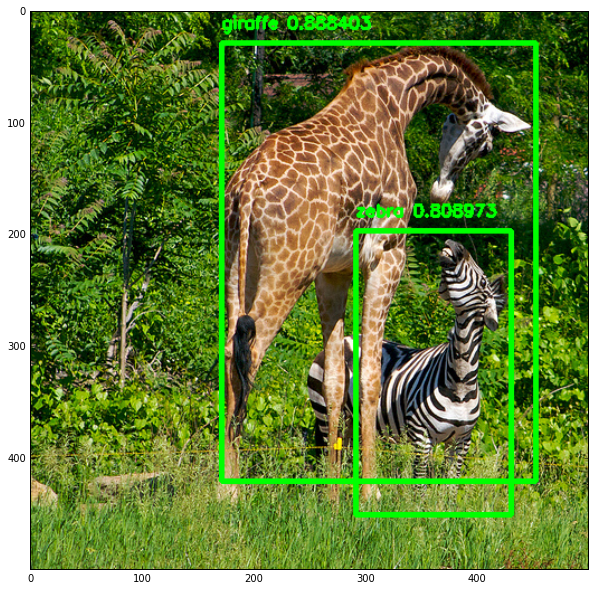

In [12]:
image = cv2.imread('images/giraffe.jpg')

plt.figure(figsize=(10,10))

input_image = cv2.resize(image, (416, 416))
input_image = input_image / 255.
input_image = input_image[:,:,::-1]
input_image = np.expand_dims(input_image, 0)

netout = model.predict([input_image, dummy_array])

boxes = decode_netout(netout[0], 
                      obj_threshold=OBJ_THRESHOLD,
                      nms_threshold=NMS_THRESHOLD,
                      anchors=ANCHORS, 
                      nb_class=CLASS)
image = draw_boxes(image, boxes, labels=LABELS)

plt.imshow(image[:,:,::-1]); plt.show()

# Perform detection on video

In [8]:
model.load_weights("weights_coco.h5")

dummy_array = np.zeros((1,1,1,1,TRUE_BOX_BUFFER,4))

In [11]:
video_inp = '../basic-yolo-keras/images/phnom_penh.mp4'
video_out = '../basic-yolo-keras/images/phnom_penh_bbox.mp4'

video_reader = cv2.VideoCapture(video_inp)

nb_frames = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
frame_h = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
frame_w = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))

video_writer = cv2.VideoWriter(video_out,
                               cv2.VideoWriter_fourcc(*'XVID'), 
                               50.0, 
                               (frame_w, frame_h))

for i in tqdm(range(nb_frames)):
    ret, image = video_reader.read()
    
    input_image = cv2.resize(image, (416, 416))
    input_image = input_image / 255.
    input_image = input_image[:,:,::-1]
    input_image = np.expand_dims(input_image, 0)

    netout = model.predict([input_image, dummy_array])

    boxes = decode_netout(netout[0], 
                          obj_threshold=0.3,
                          nms_threshold=NMS_THRESHOLD,
                          anchors=ANCHORS, 
                          nb_class=CLASS)
    image = draw_boxes(image, boxes, labels=LABELS)

    video_writer.write(np.uint8(image))
    
video_reader.release()
video_writer.release()  

100%|██████████| 4666/4666 [07:24<00:00, 10.49it/s]
